## **Proyecto de aplicación**
### Gestion de datos
Integrantes:

* Sebastián Amaya Porras

* Diana Cristina Benavides Fonseca

* Karol Yesenia Chaparro Cabrera

* María Fernanda Izquierdo Aparicio

* Erica Marcela Martínez Silva

* Leonardo Andrés Molina Rodriguez



### **1.   Elevator Pitch:**
https://livejaverianaedu-my.sharepoint.com/:v:/g/personal/mariaizquierdo_javeriana_edu_co/EZSefYGI07ZPndyp8v6DScIBjwBwAejRYUWzudgn_kSyVA?e=Y4hb8g&nav=eyJyZWZlcnJhbEluZm8iOnsicmVmZXJyYWxBcHAiOiJTdHJlYW1XZWJBcHAiLCJyZWZlcnJhbFZpZXciOiJTaGFyZURpYWxvZyIsInJlZmVycmFsQXBwUGxhdGZvcm0iOiJXZWIiLCJyZWZlcnJhbE1vZGUiOiJ2aWV3In19

####  Preguntas planteadas:

- ¿El proceso de reinserción a la vida civil para las mujeres excombatientes presenta un mayor desafío que para los hombres?

- ¿En qué periodo electoral fue más exitoso el proceso de reintegración?  y cómo impactó al proceso de reintegración la firma del acuerdo de paz?  

Justificación de la importancia de resolver las preguntas.  

Venta de su proyecto   



### **2. Carga de datos principales**

In [ ]:
# Instalación de paquete de Sodapy para poder usar la API de datos.gov.co e importe de Socrata para importar los datos
!pip install sodapy

In [ ]:
#vínculo para traer los archivos desde mi Drive

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive


In [ ]:
#conexion a la base directa, sin embargo, el servidor suele caerse
#from sodapy import Socrata
import pandas as pd
# Para usuarios no autenticados solo funcionan conjuntos de datos públicos. Tenga en cuenta 'Ninguno' en lugar del token de la aplicación y ningún nombre de usuario o contraseña:
#client = Socrata("www.datos.gov.co", None)
# DATOS A 2020: Primeros 62000 resultados, devueltos como JSON desde API / convertidos a la lista de diccionarios de Python por sodapy.
#results_2020 = client.get("x98m-gerp", limit = 113000)
# DATOS A 2023: Primeros 113000 resultados, devueltos como JSON desde API / convertidos a la lista de diccionarios de Python por sodapy.
#results_2023 = client.get("39pj-dba6", limit = 113000)
# Convertir a pandas DataFrame
#data_2020 = pd.DataFrame.from_records(results_2020)
#data_2023 = pd.DataFrame.from_records(results_2023)
data_2023=pd.read_csv('/content/ESTADISTICAS_DE_LAS_PERSONAS_DESMOVILIZADAS_QUE_HAN_INGRESADO_AL_PROCESO_DE_REINTEGRACION.csv')

In [ ]:
#Depuración de los registros que no se van a utilizar
import pandas as pd
df_Dataset=data_2023

In [ ]:
print(df_Dataset.columns)
#print(df_Dataset)

Index(['tipo_de_desmovilizaci_n', 'ex_grupo', 'a_o_desmovilizaci_n',
       'ingres_no_ingres', 'a_o_de_independizaci_n_ingreso', 'grupo_etario',
       'sexo', 'situaci_n_final_frente_al', 'departamento_de_residencia',
       'municipio_de_residencia', 'beneficiotrv', 'beneficiofa',
       'beneficiofpt', 'beneficiopdt', 'nivel_educativo',
       'm_ximo_nivel_fpt_reportado', 'l_nea_de_fpt_para_el_m_x',
       'ocupacioneconomica', 'desembolso_bie', 'tipo_de_bie_accedido',
       'desagregadodesembolsobie', 'estado_isun', 'posee_servicio_social',
       'estado_de_la_vinculaci_n', 'tipo_de_ass_vinculada',
       'posee_censo_de_familia', 'posee_c_nyuge_o_compa_ero', 'n_de_hijos',
       'total_integrantes_grupo', 'posee_censo_de_habitabilidad',
       'tipo_de_vivienda', 'r_gimen_de_tenencia_vivienda',
       'posee_serv_p_blicos_b_sicos', 'r_gimen_de_salud',
       'clasificaci_n_componente', 'fechacorte', 'fechaactualizacion'],
      dtype='object')


In [ ]:
#--------------------------------RENOMBRAR COLUMNA
df_Dataset.rename(columns={'tipo_de_desmovilizaci_n': 'TipoDesmovilizacion'}, inplace=True)
df_Dataset.rename(columns={'ex_grupo': 'ExGrupo'}, inplace=True)
df_Dataset.rename(columns={'ingres_no_ingres': 'RealizoIngreso'}, inplace=True)
df_Dataset.rename(columns={'grupo_etario': 'GrupoEtario'}, inplace=True)
df_Dataset.rename(columns={'situaci_n_final_frente_al': 'EstadoFinal'}, inplace=True)
df_Dataset.rename(columns={'departamento_de_residencia': 'DepartamentoResidencia'}, inplace=True)
df_Dataset.rename(columns={'nivel_educativo': 'NivelEducativo'}, inplace=True)
df_Dataset.rename(columns={'ocupacioneconomica': 'OcupacionEconomica'}, inplace=True)
df_Dataset.rename(columns={'desembolso_bie': 'DesembolsoBie'}, inplace=True)
df_Dataset.rename(columns={'tipo_de_bie_accedido': 'TipoBie'}, inplace=True)
df_Dataset.rename(columns={'posee_c_nyuge_o_compa_ero': 'PoseePareja'}, inplace=True)
df_Dataset.rename(columns={'tipo_de_vivienda': 'TipoVivienda'}, inplace=True)
df_Dataset.rename(columns={'r_gimen_de_tenencia_vivienda': 'NaturalezaVivienda'}, inplace=True)
df_Dataset.rename(columns={'posee_serv_p_blicos_b_sicos': 'PoseeServPublic'}, inplace=True)
df_Dataset.rename(columns={'r_gimen_de_salud': 'RegimenSalud'}, inplace=True)

#--------------------------------BORRAR COLUMNA
df_Dataset = df_Dataset.drop('a_o_de_independizaci_n_ingreso', axis=1)
df_Dataset = df_Dataset.drop('estado_isun', axis=1)
df_Dataset = df_Dataset.drop('posee_servicio_social', axis=1)
df_Dataset = df_Dataset.drop('estado_de_la_vinculaci_n', axis=1)
df_Dataset = df_Dataset.drop('tipo_de_ass_vinculada', axis=1)
df_Dataset = df_Dataset.drop('municipio_de_residencia', axis=1)
df_Dataset = df_Dataset.drop('m_ximo_nivel_fpt_reportado', axis=1)
df_Dataset = df_Dataset.drop('l_nea_de_fpt_para_el_m_x', axis=1)
df_Dataset = df_Dataset.drop('clasificaci_n_componente', axis=1)
df_Dataset = df_Dataset.drop('desagregadodesembolsobie', axis=1)
df_Dataset = df_Dataset.drop('fechacorte', axis=1)
df_Dataset = df_Dataset.drop('fechaactualizacion', axis=1)

#------RENOMBRAR COLUMNA y quitar puntos
df_Dataset.rename(columns={'a_o_desmovilizaci_n': 'AnnoDesmovilizacion'}, inplace=True)
df_Dataset['AnnoDesmovilizacion'] = df_Dataset['AnnoDesmovilizacion'].str.replace(',', '')
#------RENOMBRAR COLUMNA QUITAR ESPACIOS
df_Dataset.rename(columns={'sexo': 'Sexo'}, inplace=True)
#df_Dataset['Sexo'] = df_Dataset['Sexo'].str.replace(' ', '')
#------RENOMBRAR COLUMNA CONVERTIR A ENTERO
df_Dataset.rename(columns={'n_de_hijos': 'NumHijos'}, inplace=True)
df_Dataset['NumHijos'] = df_Dataset['NumHijos'].astype('int')
df_Dataset.rename(columns={'total_integrantes_grupo': 'NumIntegrantesFamilia'}, inplace=True)
df_Dataset['NumIntegrantesFamilia'] = df_Dataset['NumIntegrantesFamilia'].astype('int')
#------ESTANDARIZACIÓN DE NOMBRES EN LA VARABLE SEXO
df_Dataset['Sexo'] = df_Dataset['Sexo'].str.lower()

# convertir las clumnas de interes de si y no a Binario
df_Dataset['RealizoIngreso'] = df_Dataset['RealizoIngreso'].replace({'Sí': 1, 'No': 0})
df_Dataset['beneficiotrv'] = df_Dataset['beneficiotrv'].replace({'Sí': 1, 'No': 0})
df_Dataset['beneficiofa'] = df_Dataset['beneficiofa'].replace({'Sí': 1, 'No': 0})
df_Dataset['beneficiofpt'] = df_Dataset['beneficiofpt'].replace({'Sí': 1, 'No': 0})
df_Dataset['beneficiopdt'] = df_Dataset['beneficiopdt'].replace({'Sí': 1, 'No': 0})
df_Dataset['DesembolsoBie'] = df_Dataset['DesembolsoBie'].replace({'Sí': 1, 'No': 0})
df_Dataset['posee_censo_de_familia'] = df_Dataset['posee_censo_de_familia'].replace({'Sí': 1, 'No': 0})
df_Dataset['posee_censo_de_habitabilidad'] = df_Dataset['posee_censo_de_habitabilidad'].replace({'Sí': 1, 'No': 0})
df_Dataset['PoseePareja'] = df_Dataset['PoseePareja'].replace({'Sí': 1, 'No': 0})
df_Dataset['PoseeServPublic'] = df_Dataset['PoseeServPublic'].replace({'Sí': 1, 'No': 0})


In [ ]:
df_Dataset['RealizoIngreso']= df_Dataset['RealizoIngreso'].map(str)
df_Dataset['beneficiotrv']= df_Dataset['beneficiotrv'].map(str)
df_Dataset['beneficiofa']= df_Dataset['beneficiofa'].map(str)
df_Dataset['beneficiofpt']= df_Dataset['beneficiofpt'].map(str)
df_Dataset['beneficiopdt']= df_Dataset['beneficiopdt'].map(str)
df_Dataset['DesembolsoBie']= df_Dataset['DesembolsoBie'].map(str)
df_Dataset['posee_censo_de_familia']= df_Dataset['posee_censo_de_familia'].map(str)
df_Dataset['posee_censo_de_habitabilidad']= df_Dataset['posee_censo_de_habitabilidad'].map(str)
df_Dataset['PoseePareja']= df_Dataset['PoseePareja'].map(str)
df_Dataset['PoseeServPublic']= df_Dataset['PoseeServPublic'].map(str)

In [ ]:
df_Dataset.head()

,TipoDesmovilizacion,ExGrupo,AnnoDesmovilizacion,RealizoIngreso,GrupoEtario,Sexo,EstadoFinal,DepartamentoResidencia,beneficiotrv,beneficiofa,...,TipoBie,posee_censo_de_familia,PoseePareja,NumHijos,NumIntegrantesFamilia,posee_censo_de_habitabilidad,TipoVivienda,NaturalezaVivienda,PoseeServPublic,RegimenSalud
0,Colectiva,AUC,2005,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Antioquia,0,0,...,<No Aplica>,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>
1,Colectiva,AUC,2006,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Meta,0,0,...,<No Aplica>,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>
2,Individual,FARC,2008,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Cauca,0,0,...,<No Aplica>,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>
3,Individual,FARC,2007,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Meta,0,0,...,<No Aplica>,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>
4,Individual,FARC,2009,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Caquetá,0,0,...,<No Aplica>,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>




### **3.Carga y justificación de datos complementarios**

Teniendo en cuenta las preguntas planteadas y el contexto político y social del país, se consideró relevante llevar a cabo un análisis de la información de las características de las personas desmovilizadas en Colombia y su correlación con los diferentes periodos presidenciales con el fin de evidenciar si hay algunos periodos que influyeran más o menos en la desmovilización y así mismo si existió algún impacto dada la firma del acuerdo de paz.

En cuanto a la inclusión de los periodos presidenciales (del 2002 al 2023) se realizó vinculando el año de desmovilización de los individuos con los periodos presidenciales.

In [ ]:
import pandas as pd
# lee el archivo donde estan los periodos presidenciales
df_periodo = pd.read_csv('/content/PeriodoPresidencial.csv')
#extrae el nombre del presidente en el año que se desmovilizo
df_Dataset['inicioPeriodo'] =df_Dataset['AnnoDesmovilizacion'].astype('int64')
df = df_Dataset.merge(df_periodo, how='left', on='inicioPeriodo' )
df.rename(columns={'Presidente': 'PresidenteAnnoDesmo'}, inplace=True)
df = df.drop('inicioPeriodo', axis=1)
df_Dataset=df

In [ ]:
df_Dataset.head()

,TipoDesmovilizacion,ExGrupo,AnnoDesmovilizacion,RealizoIngreso,GrupoEtario,Sexo,EstadoFinal,DepartamentoResidencia,beneficiotrv,beneficiofa,...,posee_censo_de_familia,PoseePareja,NumHijos,NumIntegrantesFamilia,posee_censo_de_habitabilidad,TipoVivienda,NaturalezaVivienda,PoseeServPublic,RegimenSalud,PresidenteAnnoDesmo
0,Colectiva,AUC,2005,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Antioquia,0,0,...,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>,Alvaro Uribe Velez
1,Colectiva,AUC,2006,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Meta,0,0,...,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>,Alvaro Uribe Velez
2,Individual,FARC,2008,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Cauca,0,0,...,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>,Alvaro Uribe Velez
3,Individual,FARC,2007,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Meta,0,0,...,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>,Alvaro Uribe Velez
4,Individual,FARC,2009,1,Entre 26 y 40 años,masculino,Fuera del Proceso,Caquetá,0,0,...,0,<No Aplica>,-2,-1,0,<No Aplica>,<No Aplica>,<No Aplica>,<No Registra>,Alvaro Uribe Velez


### **4.Exploración de Datos**



#### Inventario Descriptivo de los datos:
  - **Tipo de Desmovilización:** Es la forma en la que se demosvilizó el individio (Individual o Colectiva). No se encuentran datos atípicos ni NA.
  - **Ex Grupo:** Es el grupo al margen de la ley del cuál el individuo hacía parte. No se encuentran datos atípicos ni NA.
  - **Año Desmovilización:** Año en el cuál el individuo se desmovilizó. No se encuentran datos atípicos ni NA.
  - **Ingreso/No Ingreso:** Indica si la persona ingresó o no a realizar el proceso de reintegración a la ARN (Agencia para la Reincorporación y Normalización). No se encuentran datos atípicos ni NA.
  - **Grupo Etario:** Rango de edad al que pertenece el individuo. El valor *No Registra* hace referencia a aquellas personas a las que no se les ha podido establecer su fecha de nacimiento y que por lo tanto no ha sido posible establecer a que rango de edad pertenecen. No se encuentran datos atípicos ni NA.
  - **Sexo:** Sexo del individuo. No se encuentran datos atípicos ni NA.
  - **Situación Final Frente al Proceso:** Es el estado en el que se encuentran las personas desmovilizadas en el contexto de un proceso de reintegración supervisado por la ARN (Agencia para la Reincorporación y la Normalización) en Colombia. Esta variable abarca varias categorías que describen el estado de las personas en el proceso de reintegración, incluyendo su asistencia, situación jurídica y cumplimiento de requisitos. Estas categorías incluyen: población en proceso de reintegración (activo e inactivo), población ausente del proceso de reintegración (en investigación por causal sobreviniente, en investigación por abandono, suspendido), población fuera del proceso de reintegración (pérdida de beneficios, fallecido, retiro voluntario), población que no ha ingresado al proceso de reintegración (negación de acceso, beneficios para familiares, extraditado, fallecido, desmovilizado sin registro de ingreso) y población culminada (cumplimiento exitoso de requisitos). Se aclara que en caso de fallecimiento después del acto administrativo de culminación, se mantiene el estado de "Culminado". No se observan datos atípicos ni faltantes.
  - **Departamento de Residencia:** Departamento de Residencia del individuo El valor *No Registra* corresponde a aquellas personas a quienes no se les ha podido establecer al corte de la información. No se encuentran datos atípicos ni NA.
  - **Cantidad Beneficios:** Es la unión de las variables Beneficio TRV, Beneficio FA, Beneficio FPT y Beneficio PDT.
  - **Nivel Educativo:** Variable calculada que permite establecer el máximo ciclo aprobado por el individuo teniendo en cuenta los diferentes reportes de Formación Académica y Formación para el Trabajo. **Mantener**
  - **Ocupación Económica:** Variable calculada que permite establecer la ocupación económica de los individuos para la fecha de corte. El valor *No Registra* corresponde a aquellas personas a quienes no se les ha aplicando el instrumento de tasa de desocupación. - **Limpiar Datos - Mantener**
  - **Posee Censo de Familia:** Define si el individuo posee o no censo de familia aplicado.
  - **Posee Conyuge o Compañero:** Define si el individuo tiene registrado como integrante de su grupo familiar Cónyuge o Compañero/a permanente según la aplicación del censo de familia. El valor *No Aplica* corresponde a aquellas personas a quienes no se le ha aplicado el censo de familia. El valor *No Registra* corresponde a aquellas personas que no informaron si contaban con Cónyuge o Compañero.
  - **# De hijos:** Número de hijos y/o hijastros registrados como integrantes del grupo familiar del individuo según la aplicación del censo de familia. El valor -1 corresponde a aquellas personas a quienes no se le ha aplicado el censo de familia.
  - **Total Integrantes Grupo Familiar:** Número total de integrantes del grupo familiar registrados según la aplicación del censo de familia. El valor -1 corresponde a aquellas personas a quienes no se le ha aplicado el censo de familia.
  - **Posee Censo de Habitabilidad:** Define si el individuo tiene registrada aplicación de la Encuesta de Vivienda a la fecha de corte. El instrumento de habitat busca medir las condiciones de habitabilidad de las personas que ingresaron al proceso de reintegración. El valor *No Aplica* corresponde a aquellas personas a quienes no se le ha aplicado el instrumento de habitat.
  - **Tipo de Vivienda:** Tipo de Vivienda según la aplicación de la Encuesta de Vivienda.
  - **Regimen de Tenencia Vivienda:** Régimen de tenencia de la vivienda según lo reportado en la aplicación de la Encuesta de Vivienda.(relación que existe entre los residentes y la propiedad de la vivienda, sin referencia al terreno en el cual está ubicada la misma.)
  - **Posee Serv. Públicos Básicos:** Identifica los individuos que en la Encuesta de Vivienda reportaron tener servicios públicos de agua, alcantarillado y luz.
  - **Régimen de Salud:** Variable calculada que permite establecer el régimen de salud del individuo teniendo en cuenta tanto la información del RUAF como de PILA. El valor *No Aplica* corresponde a aquellas personas que al momento del corte de la información no se encuentran en las bases de RUAF y PILA que remite el Ministerio de Salud y Protección Social al corte de la información.


In [ ]:
!pip install dataprep

Computing sub-sum-4d1144ffff0f517f76207bd5e6a8b776:  79%|███████▉  | 2464/3102 [00:17<00:08, 79.55it/s]     /usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be 


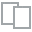
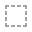
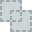
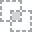
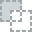
...
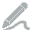
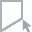
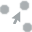
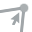
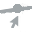

In [ ]:
from dataprep.eda import create_report
create_report(df_Dataset).show()

#### Análisis de Tendencia Central, Dispersión Tablas de Contingencia y Análsis de Sesgos

            NumHijos  NumIntegrantesFamilia
count  112071.000000          112071.000000
mean       -0.117122               1.351634
std         1.769563               2.231496
min        -2.000000              -1.000000
25%        -2.000000              -1.000000
50%         0.000000               1.000000
75%         1.000000               3.000000
max        11.000000              28.000000
NumHijos                 0.632145
NumIntegrantesFamilia    0.589701
dtype: float64


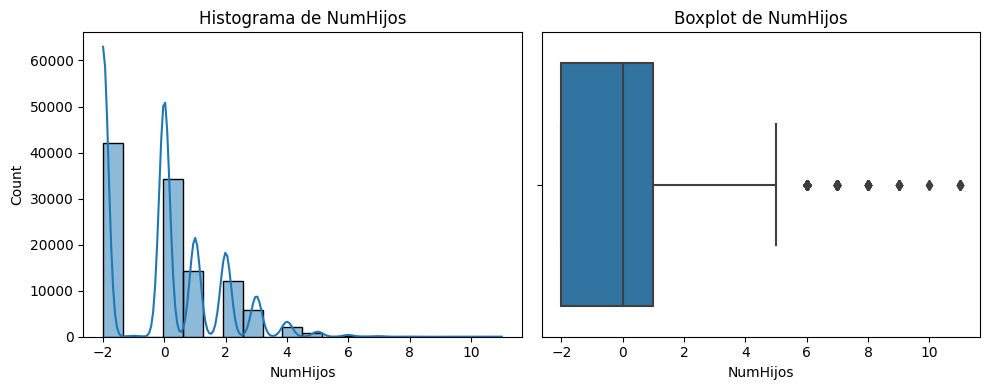

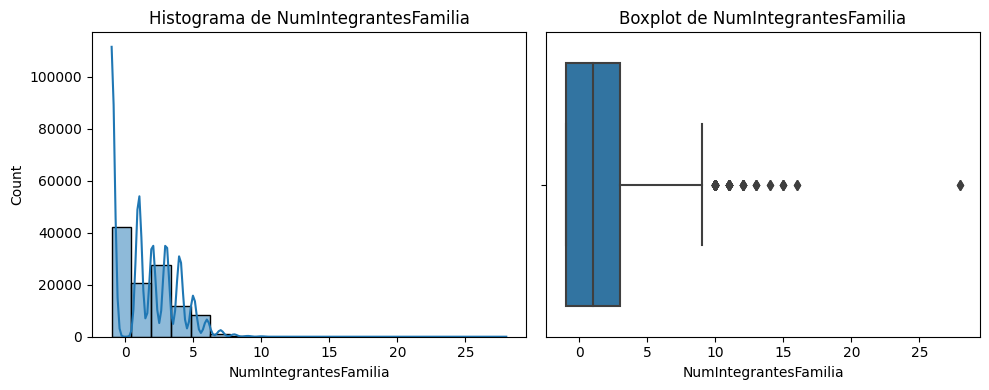

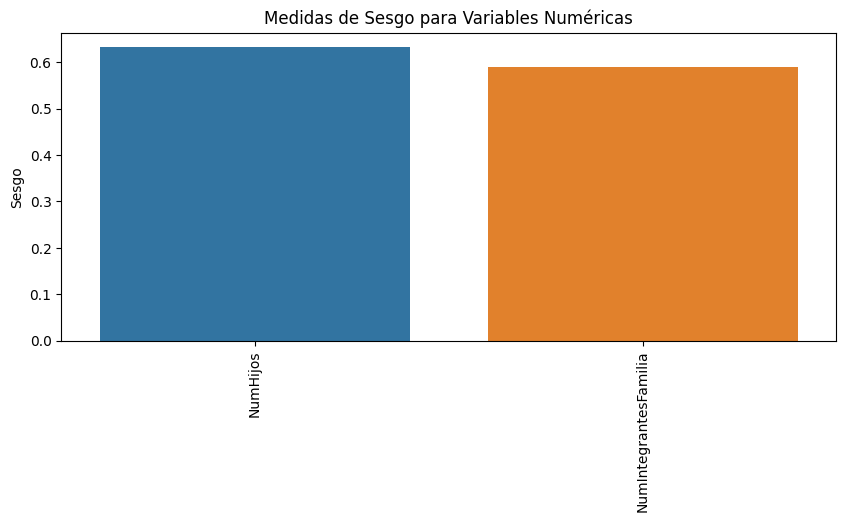

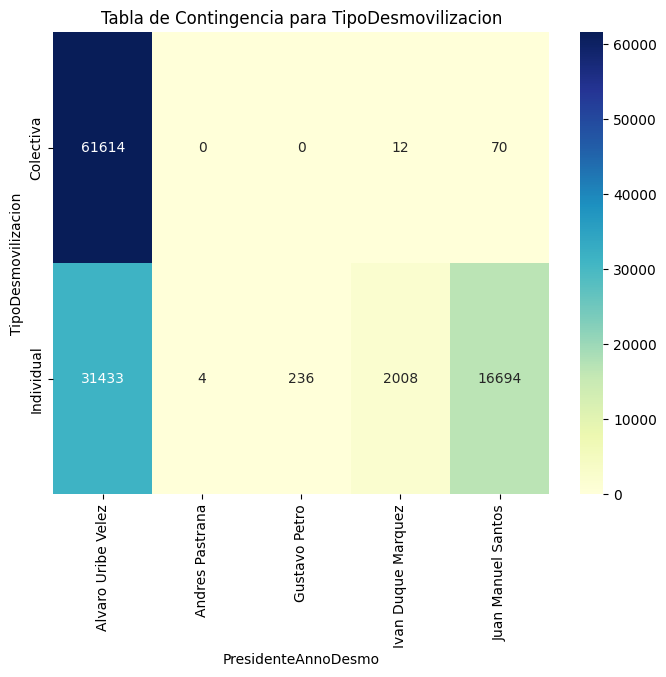

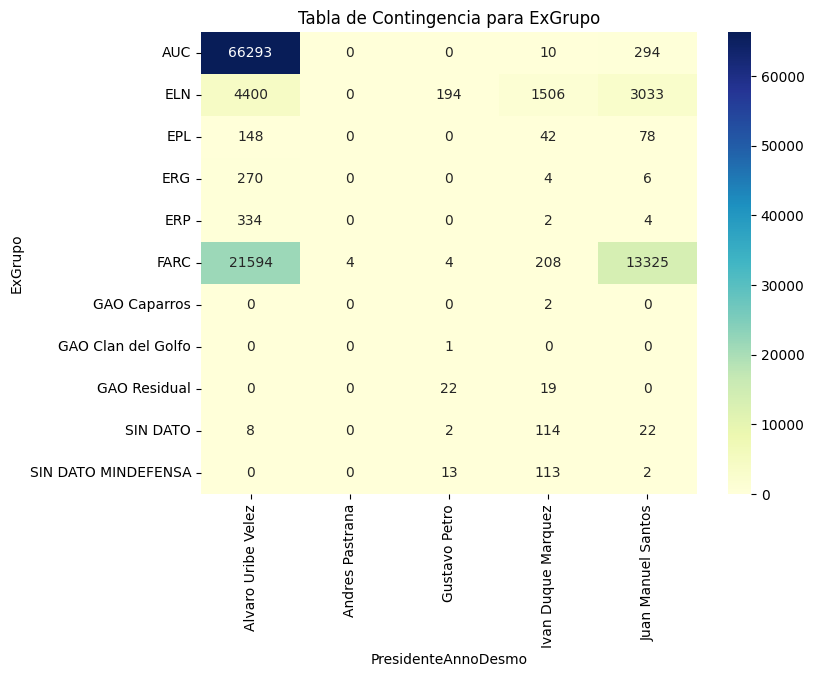

...

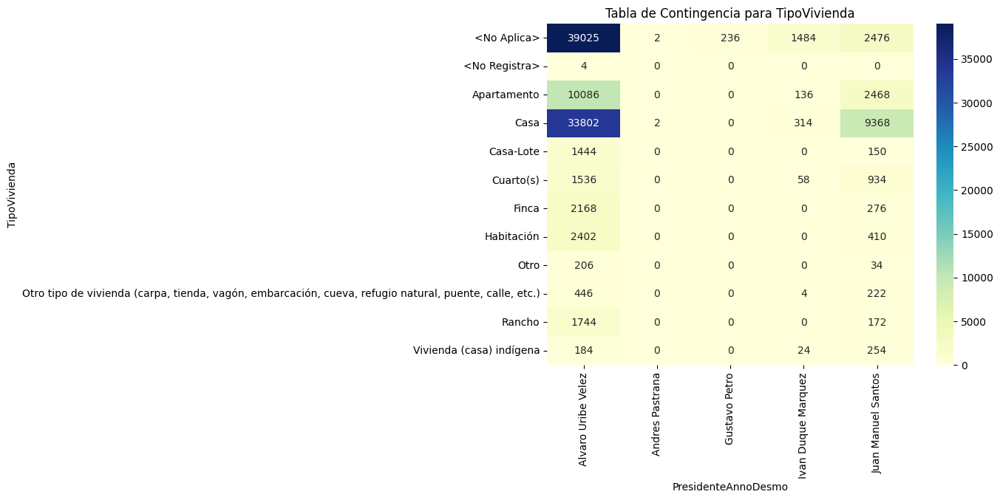

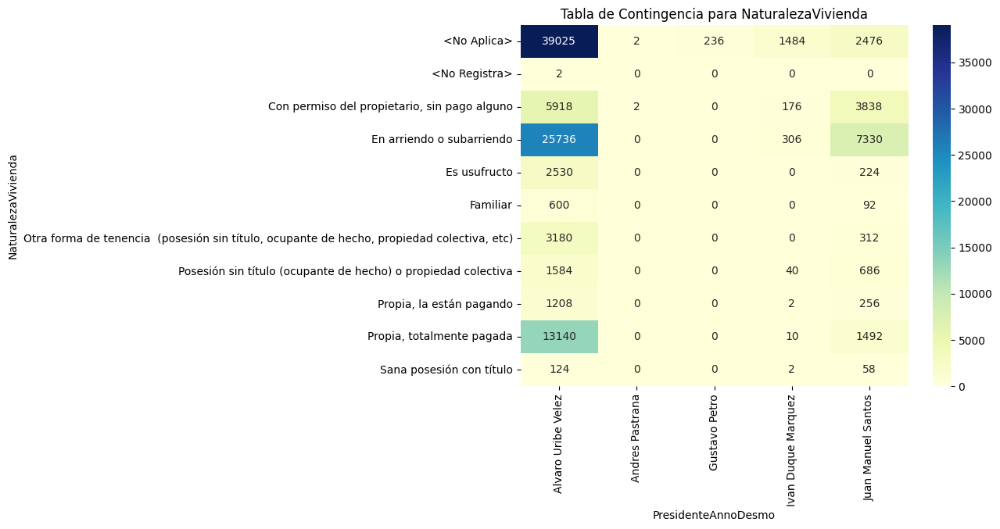

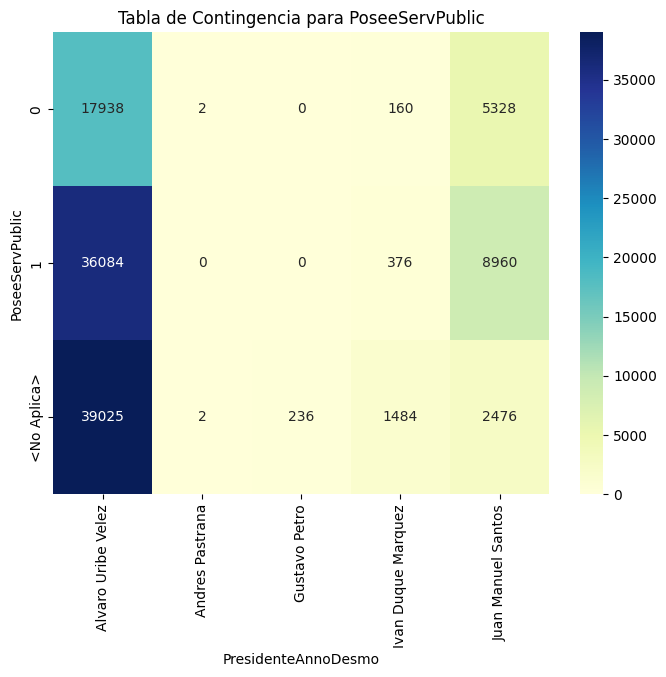

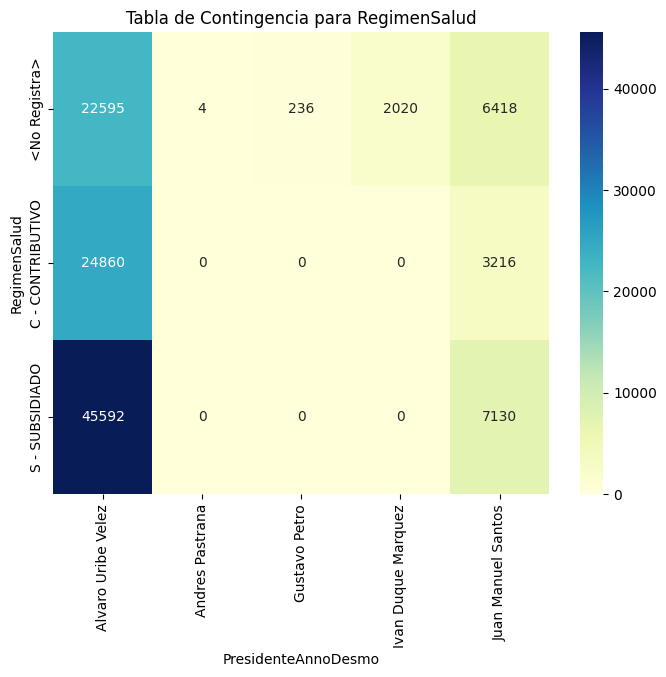

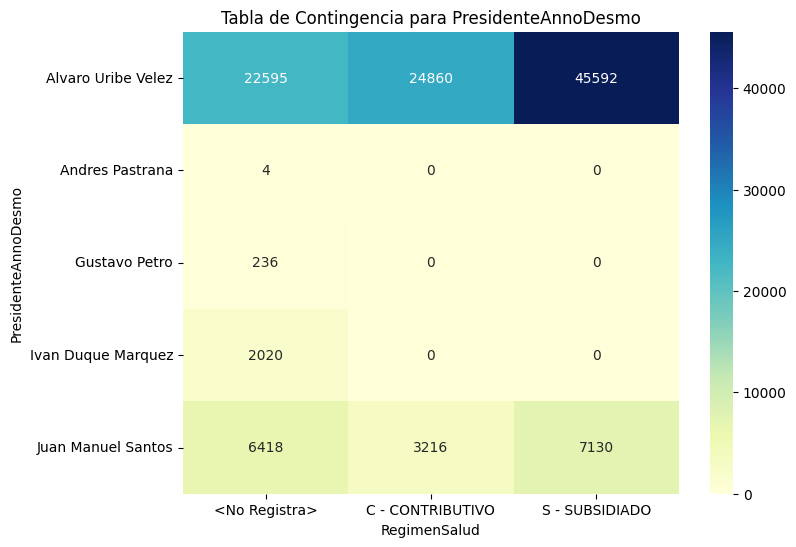

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener una descripción general de las medidas de tendencia central y dispersión
summary = df_Dataset.describe()
print(summary)
# Calcular medidas de sesgo para todas las columnas
skewness = df_Dataset[['NumHijos','NumIntegrantesFamilia']].skew()
print(skewness)
# Calcular tablas de contingencia para todas las combinaciones de variables categóricas
categorical_cols = df_Dataset.select_dtypes(include=['object']).columns
contingency_tables = {col: pd.crosstab(df_Dataset[col], df_Dataset[col2]) for col in categorical_cols for col2 in categorical_cols if col != col2}
# Visualización de histogramas para todas las columnas numéricas
numeric_cols = df_Dataset.select_dtypes(include=['float64', 'int64']).columns
for col in numeric_cols:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(df_Dataset[col], bins=20, kde=True)
    plt.title(f'Histograma de {col}')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_Dataset[col])
    plt.title(f'Boxplot de {col}')
    plt.tight_layout()
    plt.show()
# Visualización de medidas de sesgo
plt.figure(figsize=(10, 4))
sns.barplot(x=skewness.index, y=skewness.values)
plt.xticks(rotation=90)
plt.title('Medidas de Sesgo para Variables Numéricas')
plt.ylabel('Sesgo')
plt.show()
# Visualización de tablas de contingencia
for col, table in contingency_tables.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(table, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'Tabla de Contingencia para {col}')
    plt.show()


#### Correlación y Covarianza

<ipython-input-84-3fb0ecdb0590>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_Dataset.corr()
<ipython-input-84-3fb0ecdb0590>:7: FutureWarning: The default value of numeric_only in DataFrame.cov is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  covariance_matrix = df_Dataset.cov()


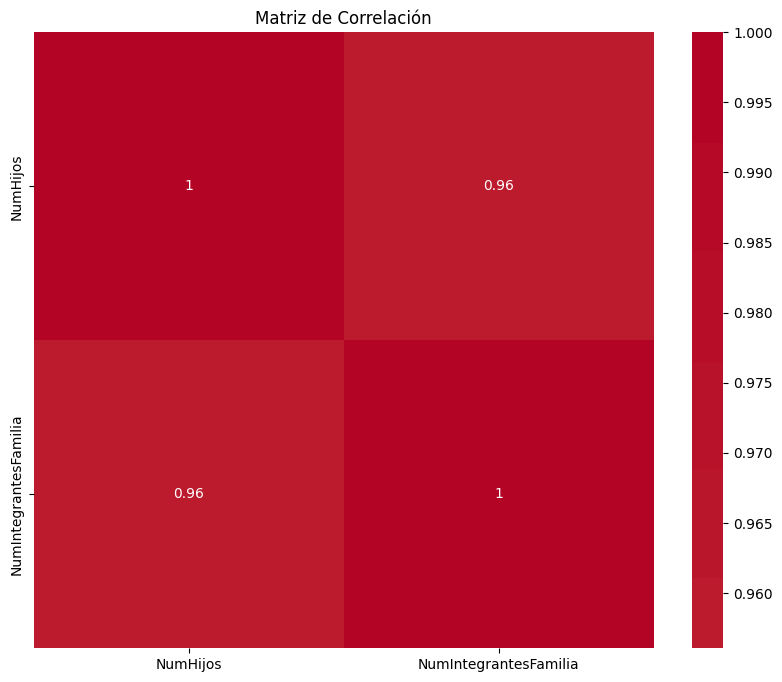

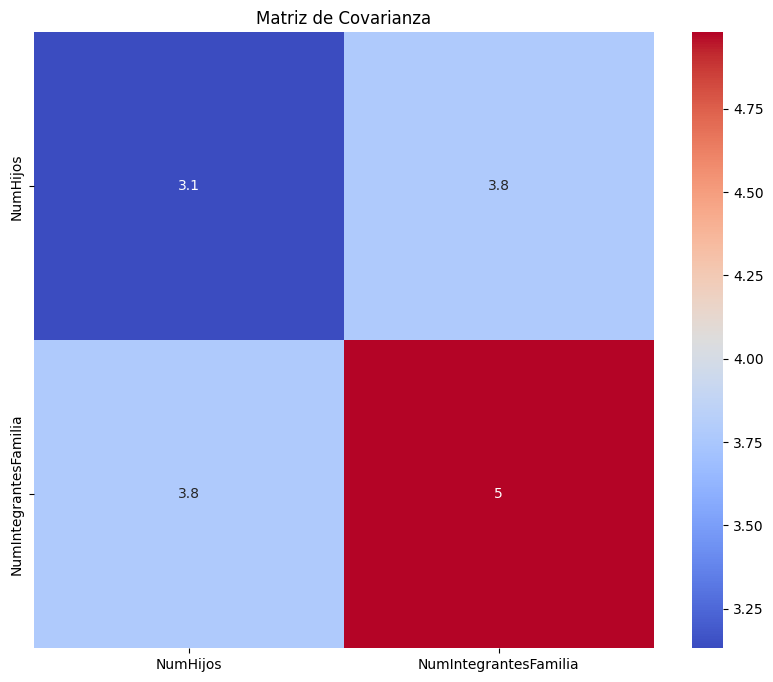

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular la matriz de correlación
correlation_matrix = df_Dataset.corr()
# Calcular la matriz de covarianza
covariance_matrix = df_Dataset.cov()
# Mapa de calor para la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Matriz de Correlación")
plt.show()

# Mapa de calor para la matriz de covarianza
plt.figure(figsize=(10, 8))
sns.heatmap(covariance_matrix, annot=True, cmap='coolwarm')
plt.title("Matriz de Covarianza")
plt.show()

#Cargue del archivo listo para el análisis
df_Dataset.to_csv('VistaMinable.csv', index=False)

En conclusión:

* Para la variable “TipoDesmovilizacion”, la cual tiene dos niveles, se evidencia que 55.05% de los desmovilizados hicieron su proceso de manera colectiva, mientras que el restante 44.95% lo hizo de manera individual.

* En la variable “ExGrupo”, la cual tiene en total 11 posibles respuestas, el 98.92 de los desmovilizados salieron principalmente de las AUC, las FARC y el ELN (59.42%, 31.35% y 8.15 respectivamente) y el restante 1.08% salieron de otros grupos al margen de la ley, como lo son ERG, ERP, EPL, GAO y otros.

* Del año de desmovilización se destaca que entre 2004 y 2006 el 67.15% de los encuestados se desmovilizó. A este periodo le siguen el comprendido entre 2007 y 2009 donde otro 15.52% se desmovilizó. El restante de los desmovilizados lo hizo en los años de 2010 hasta el 2023.  

* En la variable "RealizoIngreso", la cual tiene dos niveles, se evidencia que el 95.28% de los desmovilizados que hacen parte de la base de datos se reintegraron a la sociedad, mientras que el restante 4.72% no lo hizo.

* En cuanto a “GrupoEtareo” la cual hace referencia a grupos de edad de los desmovilizados, se tiene que la mayoría (53.74%) tiene entre 41 y 60 años, seguido por el grupo que tiene entre 26 y 40 años (40.68%). En tercer lugar, se encuentran los mayores a 60 años (3.30%) y finalmente, aquellos entre 18 y 25 años (2.18%). Hay una pequeña proporción de desmovilizados que no registran edad (0.09%).

* En la variable "Sexo", la cual tiene dos niveles, se evidencia que el 86.71% de los desmovilizados son hombres, mientras que el restante 13.29% son mujeres.

* Con el “DepartamentoResidencia” se evidencia que Antioquia y Bogotá D.C. son los departamentos con mayor cantidad de desmovilizados registrados con un 21.61% y 9.72%, seguido por Meta, Córdoba, César y Valle del Cauca (5.99%, 5.78%, 5.38%, 5.24% respectivamente). Hay un 4.64% que no registra residencia y el restante 41,64% de desmovilizados reside en los 28 departamentos restantes.  

* En “Nivel Educativo” se evidencia que 31.77% de los desmovilizados son bachilleres, el 26.72% tienen un nivel de Básica Primaria, el 19.32% tienen Por establecer su nivel educativo, 15,04% tienen un nivel de Básica Secundaria y el restante 7.16% solo cuentan con un nivel de Alfabetización.

* De la variable “OcupacionEconomica” se ve que el 48.87% de los desmovilizados están en el sector informal, el 19.67% y el 12.73% no registran y no aplican respectivamente, y el 10.48% son de la población económica inactiva y el 8.26% son desocupados  

* Con “DesembolsoBie”, que tiene dos niveles, se evidencia que el 51.22% de los desmovilizados no recibieron un desembolso de Beneficio de Inserción Económica, mientras que el restante 48.77% si lo recibió.

* Ahora, con “TipoBie” se tiene que el 51.22% de los desmovilizados no recibieron un desembolso de Beneficio de Inserción Económica no aplica para esta variable, mientras que de los que si recibieron el desembolso el 47.36% recibió un beneficio para plan de negocio y el restante 1.42% lo recibió para vivienda o educación superior.

* En la variable “Posee_censo_de_Familia”, que tiene dos niveles, se evidencia que al 62.52% de los desmovilizado si se les aplicó un censo de variables familiares, mientras que el restante 37.48% no lo ha realizado.

* De la variable “PoseePareja” el 37.48% tiene una respuesta de “No Aplica” porque no tiene respuesta en la variable anterior. De los desmovilizados restantes 31.45% tienen pareja y el 30.95% no la tiene.

* “NaturalezaVivienda” el 37.57% tiene una respuesta de “No Aplica” porque no tiene respuesta en la variable de censo habitacional. De los desmovilizados restantes que si tienen respuesta, el 29.78% se encuentra viviendo en arriendo o subarriendo y el 13,06% tiene vivienda propia totalmente pagada, el 8.86% vive con permiso del propietario pero no tienen que pagar, el 3.12% vive en otras formas habitacionales y restante porcentaje de 7.61% se divide en vivienda en usufructo, posesion de vivienda sin título, vivienda propia en proceso de pago, vivienda familiar, o vivienda colectiva.

* “PoseeSevPublic” tiene una respuesta de “No Aplica” porque no tiene respuesta en la variable de censo habitacional. De los desmovilizados restantes 40.53% cuentan con servicios públicos y el 20.90% no.

* En la variable de “RegimenSalud” se evidencia que el 47.04% de los desmovilizados tiene un régimen de salud subsidiado, el 25.05% están afiliados al régimen contributivo y el 27.90% no registra respuesta.

Para las variables numéricas se encontró una alta correlación entre las variables número de hijos e integrantes de la familia y adicionalmente tienen un sesgo positivo con presencia de outliers.

Continuando con el análisis de la base de datos, se procedió a calcular las correlaciones y covarianzas entre las variables "RealizoIngreso", "DesembolsoBie", "NumHijos", "NumIntegrantesFamilia" y "CantidadBeneficios". A partir de estos cálculos, se obtuvieron las siguientes observaciones sobre las relaciones entre estas variables:

* En relación a la variable "RealizoIngreso", se observó que presenta una correlación positiva con "DesembolsoBie", "NumHijos" y "NumIntegrantesFamilia". Esto sugiere que cuando una de estas variables aumenta, es probable que las otras también aumenten en proporción. Por otro lado, la correlación con "CantidadBeneficios" es cercana a cero, lo que indica una débil o nula relación lineal entre estas dos variables.

* En cuanto a la variable "DesembolsoBie", se encontró que tiene correlación positiva con "RealizoIngreso", "NumHijos" y "NumIntegrantesFamilia". De manera similar a antes, esto sugiere que, si una variable aumenta, es probable que las otras también lo hagan. En contraste, la correlación con "CantidadBeneficios" es baja y negativa, sugiriendo una relación inversa: si una variable aumenta, la otra tiende a disminuir.

* En lo que respecta a "NumHijos", se observó correlación positiva con "DesembolsoBie" y "RealizoIngreso". Por otro lado, la correlación con "CantidadBeneficios" es cercana a cero, lo que implica poca relación lineal entre ellas. Adicionalmente, se notó una correlación positiva casi perfecta de 0.96 con "NumIntegrantesFamilia", lo que podría indicar una redundancia entre ambas variables, y sugerir la posibilidad de eliminar una de ellas o llevar a cabo más análisis.

En relación a la covarianza entre estas variables, se encontraron las siguientes observaciones:

* Para "RealizoIngreso", la covarianza con "DesembolsoBie", "NumHijos", "NumIntegrantesFamilia" y "CantidadBeneficios" es muy cercana a cero. Esto sugiere que no hay una relación definida entre estas variables para cambiar en conjunto.

* Para "DesembolsoBie", la covarianza con "RealizoIngreso" y "CantidadBeneficios" también es muy cercana a cero. Sin embargo, la covarianza con "NumHijos" y "NumIntegrantesFamilia" es positiva, indicando que estas dos variables tienden a cambiar en la misma dirección.

* En el caso de "NumHijos", la covarianza con "RealizoIngreso", "CantidadBeneficios" y "DesembolsoBie" también es cercana a cero. No obstante, la covarianza con "NumIntegrantesFamilia" es alta (3.8), indicando una fuerte tendencia a cambiar en la misma dirección.

En conclusión, se enfatiza que los valores de covarianza pueden ser interpretados de manera ambigua debido a las escalas de las variables. Por lo tanto, se recomienda que los análisis basados en los valores de correlación sean considerados para obtener una comprensión más sólida de las relaciones entre las variables.



#### Análisis de Calidad de los Datos

El análisis de la calidad de los datos revela la integridad y confiabilidad de la información recopilada. Al examinar la consistencia de los valores obtenidos, se identificaron casos de valores atípicos, especialmente en variables demográficas donde se observan números negativos (como el número de hijos con un valor de "-2") y una alta concentración de respuestas con "No Aplica". Estos casos corresponden a registros de desmovilizados que se han reintegrado, pero aún no se les ha aplicado los censos complementarios de la encuesta que genera esta base de datos, por tal motivo el análisis se va a centrar en aquellos desmovilizados que poseen censos.

De manera paralela, la completitud de los registros mostró un nivel nulo de ausencia de datos, por lo que no evidenciamos que la representatividad y precisión del análisis puedan verse afectadas.

Se realizó un análisis de contraste de datos contra diferentes fuentes y se encuentra que la base tiene un alto grado de exactitud en cuanto al número de desmovilizados.Asimismo, se examinó la actualidad de los datos y se encontró que los registros datan de este año, además de que se actualizan varias veces a lo largo del año. Por lo tanto, la aplicabilidad de los hallazgos es relativamente confiable.

### **5. Preparación de los datos**

 #### Identificación de nuevas variables derivadas a partir de las originales(calculadas).  

* Periodo Presidencial: Se registra el periodo de cada gobierno según los años proporcionados, con el propósito de examinar los efectos de la desmovilización y reintegración en Colombia de acuerdo a cada periodo presidencial. Dado que los mandatos presidenciales inician en agosto y concluyen cuatro años después en julio, se determina cuál presidente tuvo una mayor duración durante cada año de transición. Esto establece los intervalos presidenciales en nuestra base de datos.

* Cantidad de Beneficios: Debido a la naturaleza binaria de los beneficios registrados (TRV, FA, FPT, PDT) y el no tener montos económicos asociados a estos, se determina que la mejor (y más práctica) alternativa es realizar la suma de la cantidad de beneficios que cada desmovilizado reintegrado ha recibido para determinar si la precencia o ausencia de éstos mismos influye en las respuestas a las preguntas planteadas.  



In [ ]:
#--------------------------------sumar todos los beneficios que pueden obtenerse
df_Dataset['beneficiotrv']=df_Dataset['beneficiotrv'].replace({'Sí': 1, 'No': 0}).astype(int)
df_Dataset['beneficiofa']=df_Dataset['beneficiofa'].replace({'Sí': 1, 'No': 0}).astype(int)
df_Dataset['beneficiofpt']=df_Dataset['beneficiofpt'].replace({'Sí': 1, 'No': 0}).astype(int)
df_Dataset['beneficiopdt']=df_Dataset['beneficiopdt'].replace({'Sí': 1, 'No': 0}).astype(int)


df_Dataset['CantidadBeneficios'] = df_Dataset['beneficiotrv'] + df_Dataset['beneficiofa']+ df_Dataset['beneficiofpt'] + df_Dataset['beneficiopdt']
df_Dataset = df_Dataset.drop('beneficiotrv', axis=1)
df_Dataset = df_Dataset.drop('beneficiofa', axis=1)
df_Dataset = df_Dataset.drop('beneficiofpt', axis=1)
df_Dataset = df_Dataset.drop('beneficiopdt', axis=1)

In [ ]:
df_Dataset = df_Dataset[df_Dataset['posee_censo_de_familia'] != '0']
df_Dataset = df_Dataset[df_Dataset['posee_censo_de_habitabilidad'] != '0']

In [ ]:
df_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65843 entries, 36 to 112070
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   TipoDesmovilizacion           65843 non-null  object
 1   ExGrupo                       65843 non-null  object
 2   AnnoDesmovilizacion           65843 non-null  object
 3   RealizoIngreso                65843 non-null  object
 4   GrupoEtario                   65843 non-null  object
 5   Sexo                          65843 non-null  object
 6   EstadoFinal                   65843 non-null  object
 7   DepartamentoResidencia        65843 non-null  object
 8   NivelEducativo                65843 non-null  object
 9   OcupacionEconomica            65843 non-null  object
 10  DesembolsoBie                 65843 non-null  object
 11  TipoBie                       65843 non-null  object
 12  posee_censo_de_familia        65843 non-null  object
 13  PoseePareja   

#### Transformaciones realizadas

Teniendo en cuenta las preguntas planteadas y dado que queremos aprovechar el contenido demográfico de la base de datos, nos vamos a enfocar en aquellos desmovilizados que tienen censo de familia y de habitabilidad.

* Cambio de nombre de columnas

  * 'tipo_de_desmovilizaci_n' a 'TipoDesmovilizacion'

  * 'ex_grupo' a 'ExGrupo'

  * 'ingres_no_ingres' a 'RealizoIngreso'

  * 'grupo_etario' a 'GrupoEtario'

  * 'situaci_n_final_frente_al'a'EstadoFinal'

  * 'departamento_de_residencia' a 'DepartamentoResidencia'

  * 'nivel_educativo' a 'NivelEducativo'

  * 'ocupacioneconomica' a 'OcupacionEconomica'

  * 'desembolso_bie' a 'DesembolsoBie'

  * 'tipo_de_bie_accedido' a 'TipoBie'

  * 'posee_c_nyuge_o_compa_ero' a 'PoseePareja'

  * 'tipo_de_vivienda' a 'TipoVivienda'

  * 'r_gimen_de_tenencia_vivienda' a 'NaturalezaVivienda'

  * 'posee_serv_p_blicos_b_sicos' a 'PoseeServPublic'

  * 'r_gimen_de_salud'a 'RegimenSalud'

  * 'a_o_desmovilizaci_n': a 'AnnoDesmovilizacion'

  * 'sexo': a 'Sexo'

  * 'n_de_hijos': a 'NumHijos'

  * 'total_integrantes_grupo': a 'NumIntegrantesFamilia'

* Para la estandarización de los datos:

  * A la columna de Sexo se le quitaron los espacios en sus niveles y se pusieron todos los niveles en minúscula

  * A la columna de Año se le quitaron los puntos (EG. 2.002 a 2002)

  * La columna de Número de Hijos se convirtió a entero

* Se eliminaron las siguientes variables ya que no tienen incidencia para la respuesta a las preguntas  

  * 'a_o_de_independizaci_n_ingreso'

  * 'estado_isun'

  * 'posee_servicio_social'

  * 'estado_de_la_vinculaci_n'

  * 'tipo_de_ass_vinculada'

  * 'municipio_de_residencia'

  * 'm_ximo_nivel_fpt_reportado'

  * 'l_nea_de_fpt_para_el_m_x'

  * 'clasificaci_n_componente'

  * 'desagregadodesembolsobie'

  * 'posee_censo_de_habitabilidad'

  * 'fechacorte'

  * 'fechaactualizacion'

  * 'posee_censo_de_familia'

* Se convirtieron a variables binarias para las siguientes variables dado que antes tenian “Si” y “No” a 1 para “Si” y 0 para “No”.

  * 'RealizoIngreso'

  * 'DesembolsoBie'

  * 'PoseePareja'

  * 'PoseeServPublic'

In [ ]:
df_Dataset = df_Dataset.drop('posee_censo_de_familia', axis=1)
df_Dataset = df_Dataset.drop('posee_censo_de_habitabilidad', axis=1)

In [ ]:
df_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65843 entries, 36 to 112070
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   TipoDesmovilizacion     65843 non-null  object
 1   ExGrupo                 65843 non-null  object
 2   AnnoDesmovilizacion     65843 non-null  object
 3   RealizoIngreso          65843 non-null  object
 4   GrupoEtario             65843 non-null  object
 5   Sexo                    65843 non-null  object
 6   EstadoFinal             65843 non-null  object
 7   DepartamentoResidencia  65843 non-null  object
 8   NivelEducativo          65843 non-null  object
 9   OcupacionEconomica      65843 non-null  object
 10  DesembolsoBie           65843 non-null  object
 11  TipoBie                 65843 non-null  object
 12  PoseePareja             65843 non-null  object
 13  NumHijos                65843 non-null  int64 
 14  NumIntegrantesFamilia   65843 non-null  int64 
 15  

In [ ]:
pd.options.display.max_columns = 50
pd.options.display.max_rows=100

In [ ]:
Resultado=df_Dataset.groupby(['AnnoDesmovilizacion', 'ExGrupo']).count()
Resultado

TipoDesmovilizacion  RealizoIngreso  \
AnnoDesmovilizacion ExGrupo                                         
2001                FARC                        2               2   
2002                ELN                         4               4   
                    FARC                        4               4   
2003                AUC                      1052            1052   
                    ELN                       270             270   
                    EPL                        10              10   
                    ERG                         8               8   
                    ERP                         6               6   
                    FARC                      754             754   
2004                AUC                      3166            3166   
                    ELN                       210             210   
                    EPL                         8               8   
                    ERG                        24              24   
                    ERP                         4               4   
                    FARC                      824             824   
2005                AUC                     10968           10968   
                    ELN                       272             272   
                    EPL                        12              12   
                    ERG                        14              14   
                    ERP                         4               4   
                    FARC                      846             846   
                    SIN DATO                    2               2   
2006                AUC                     20716           20716   
                    ELN                       340             340   
                    EPL                        38              38   
                    ERG                         2               2   
                    ERP                        42              42   
                    FARC                     1668            1668   
2007                AUC                        70              70   
                    ELN                       420             420   
                    EPL                        16              16   
                    ERG                        28              28   
                    ERP                       146             146   
                    FARC                     2380            2380   
                    SIN DATO                    2               2   
2008                AUC                       112             112   
                    ELN                       376             376   
                    EPL                         2               2   
                    ERG                        78              78   
                    ERP                         6               6   
                    FARC                     2982            2982   
2009                AUC                         8               8   
                    ELN                       572             572   
                    EPL                         6               6   
                    ERG                         6               6   
                    ERP                         8               8   
                    FARC                     2822            2822   
2010                AUC                       158             158   
                    ELN                       394             394   
                    EPL                         2               2   
                    FARC                     2476            2476   
                    SIN DATO                    4               4   
2011                AUC                        26              26   
                    ELN                       226             226   
                    EPL                         4               4   
                    FARC                     1675            1675   
2012                AUC     

In [ ]:
Resultado.to_csv('Resultado.csv')

Computing finalize-94873e40-834a-4c30-8f74-404f9641097d:  64%|██████▍   | 1379/2142 [00:03<00:01, 587.35it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be

DataPrep Report
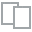
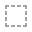
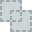
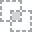
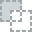
...
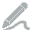
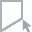
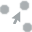
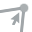
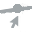

In [ ]:
create_report(df_Dataset)

In [ ]:
df_Dataset['NumHijos'] = df_Dataset['NumHijos'].replace(-1, '<No Registra>')

### **6. Visualización de los datos**

#### Para la pregunta de si el proceso de desmovilización fue más retador para mujeres que para hombres:

Tipo de desmovilizacion x genero

In [ ]:
import pandas as pd
from tabulate import tabulate
df_fem=df_Dataset[df_Dataset['Sexo']=='femenino']
df_fem['TipoDesmovilizacion'].value_counts()/len(df_fem)

Individual    0.72789
Colectiva     0.27211
Name: TipoDesmovilizacion, dtype: float64

In [ ]:
df_mas=df_Dataset[df_Dataset['Sexo']=='masculino']
df_mas['TipoDesmovilizacion'].value_counts()/len(df_mas)

Colectiva     0.565353
Individual    0.434647
Name: TipoDesmovilizacion, dtype: float64

Porcentaje participacion en grupos.

In [ ]:
df_fem['ExGrupo'].value_counts()/len(df_fem)

FARC        0.569055
AUC         0.291406
ELN         0.124710
ERP         0.005539
ERG         0.005360
EPL         0.003573
SIN DATO    0.000357
Name: ExGrupo, dtype: float64

In [ ]:
df_mas['ExGrupo'].value_counts()/len(df_mas)

AUC         0.604220
FARC        0.317499
ELN         0.070486
ERP         0.002818
EPL         0.002635
ERG         0.001866
SIN DATO    0.000476
Name: ExGrupo, dtype: float64

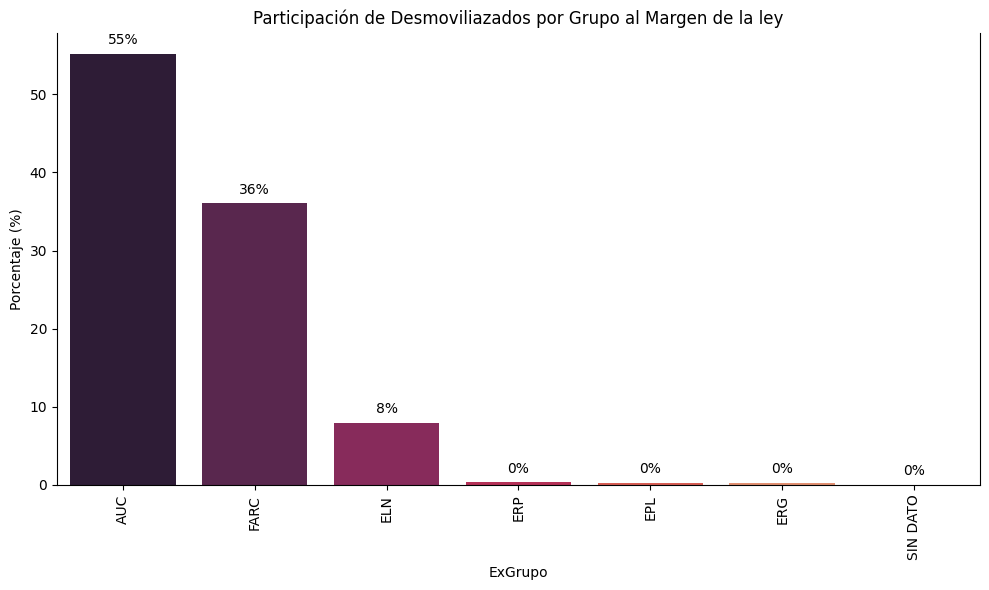

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Calcular los porcentajes de cada categoría
total_datos = len(data)
porcentajes = [(data['ExGrupo'].value_counts()[cat] / total_datos) * 100 for cat in data['ExGrupo'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = data['ExGrupo'].unique()
porcentajes_df = pd.DataFrame({'ExGrupo': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("rocket", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='ExGrupo', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior
plt.title('Participación de Desmoviliazados por Grupo al Margen de la ley')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()

# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/Grupo.png', transparent=True)

plt.show()


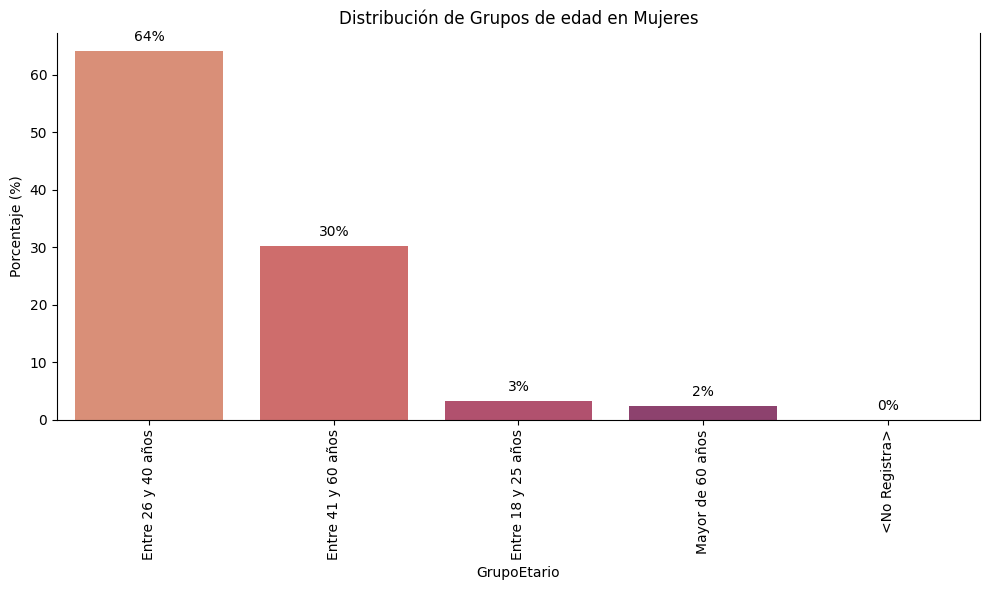

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['GrupoEtario'].value_counts()[cat] / total_datos) * 100 for cat in df['GrupoEtario'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['GrupoEtario'].unique()
porcentajes_df = pd.DataFrame({'GrupoEtario': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='GrupoEtario', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior
plt.title('Distribución de Grupos de edad en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()

# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/edadmuj.png', transparent=True)

plt.show()



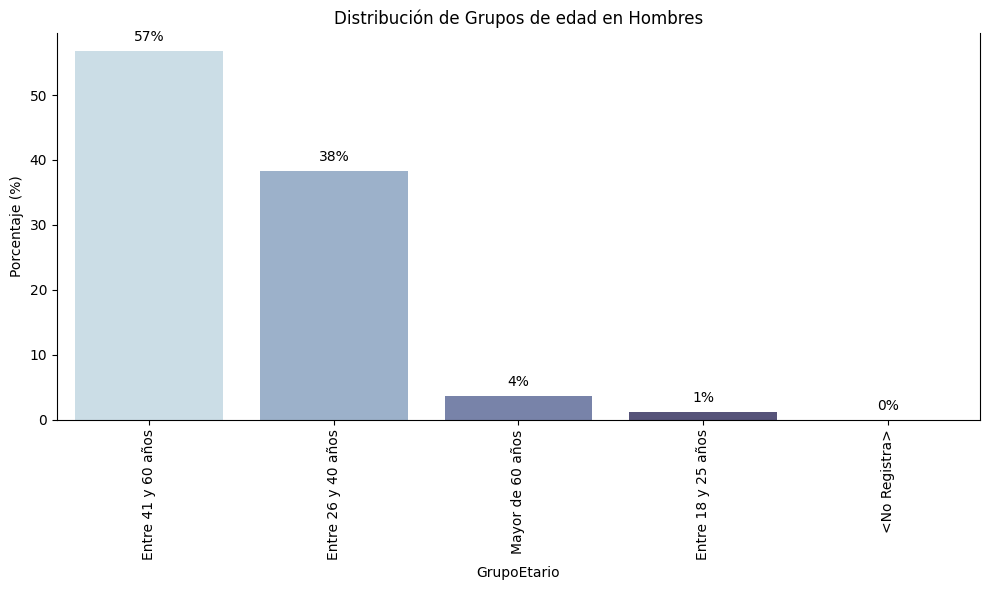

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['GrupoEtario'].value_counts()[cat] / total_datos) * 100 for cat in df['GrupoEtario'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['GrupoEtario'].unique()
porcentajes_df = pd.DataFrame({'GrupoEtario': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='GrupoEtario', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior
plt.title('Distribución de Grupos de edad en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
plt.savefig('/content/edadhom.png', transparent=True)
plt.show()


Estado final frente al proceso

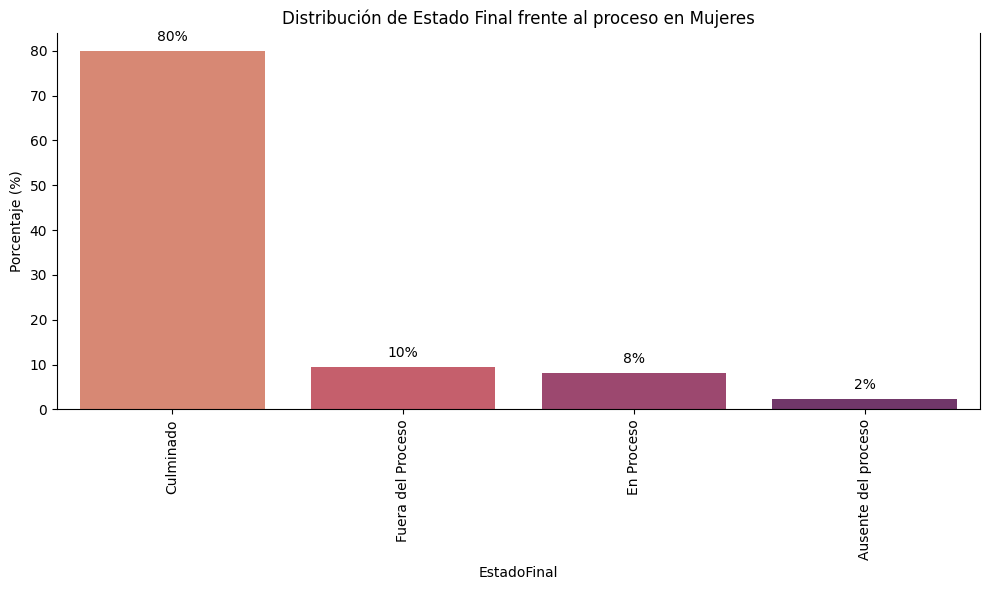

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['EstadoFinal'].value_counts()[cat] / total_datos) * 100 for cat in df['EstadoFinal'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['EstadoFinal'].unique()
porcentajes_df = pd.DataFrame({'EstadoFinal': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='EstadoFinal', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Estado Final frente al proceso en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/efinalmuj.png', transparent=True)
plt.show()


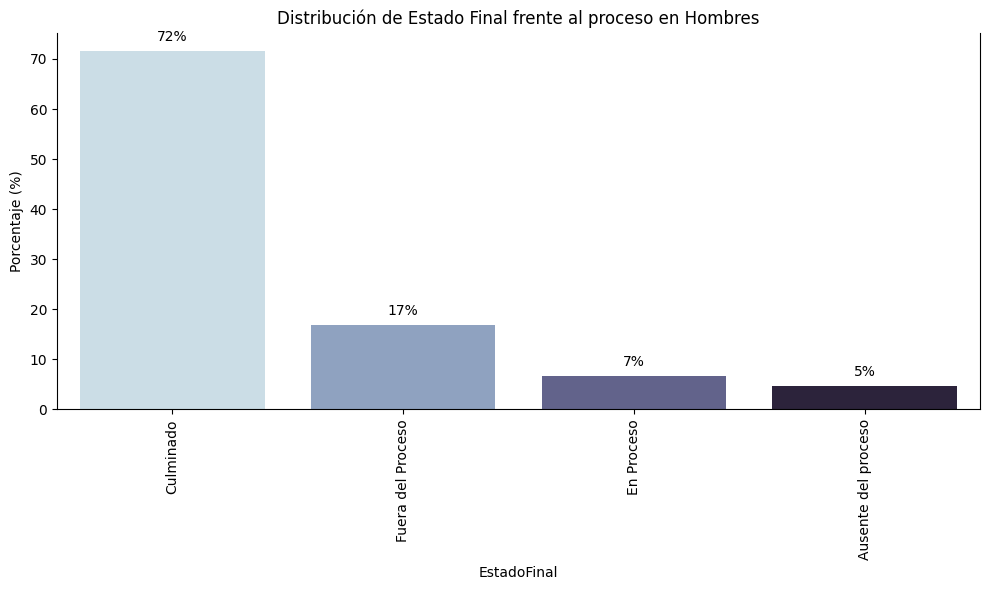

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['EstadoFinal'].value_counts()[cat] / total_datos) * 100 for cat in df['EstadoFinal'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['EstadoFinal'].unique()
porcentajes_df = pd.DataFrame({'EstadoFinal': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='EstadoFinal', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Estado Final frente al proceso en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/efinalhom.png', transparent=True)
plt.show()

Nivel educativo

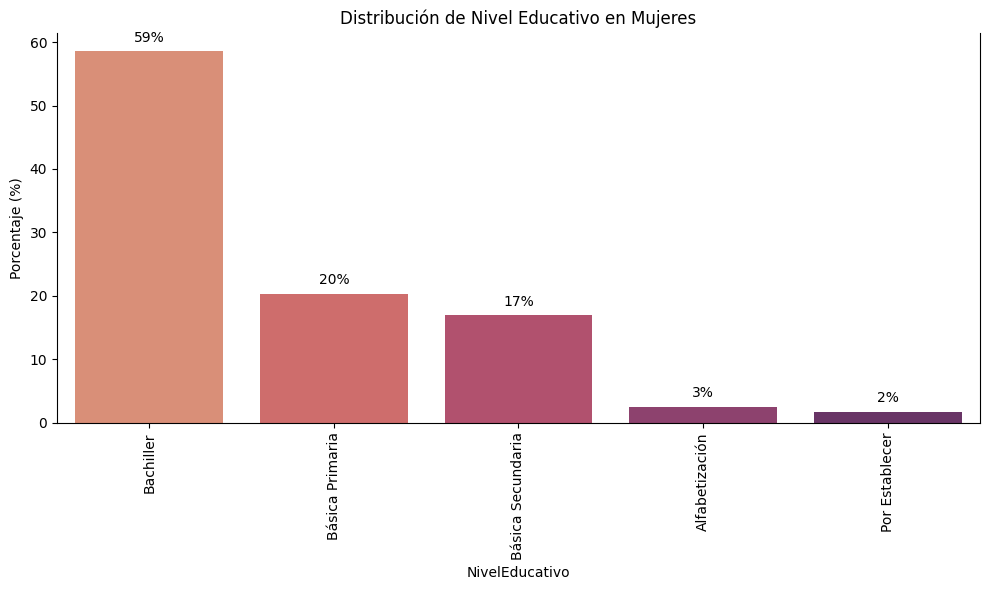

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NivelEducativo'].value_counts()[cat] / total_datos) * 100 for cat in df['NivelEducativo'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NivelEducativo'].unique()
porcentajes_df = pd.DataFrame({'NivelEducativo': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NivelEducativo', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Nivel Educativo en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/niveleducmuj.png', transparent=True)

plt.show()


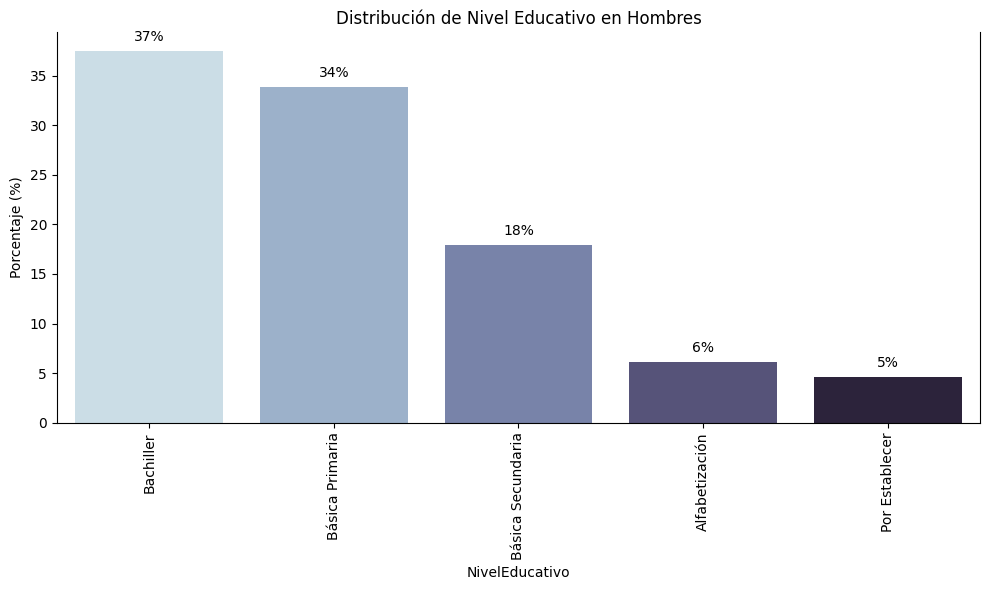

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NivelEducativo'].value_counts()[cat] / total_datos) * 100 for cat in df['NivelEducativo'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NivelEducativo'].unique()
porcentajes_df = pd.DataFrame({'NivelEducativo': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NivelEducativo', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Nivel Educativo en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/niveleduchom.png', transparent=True)

plt.show()

Ocupacion

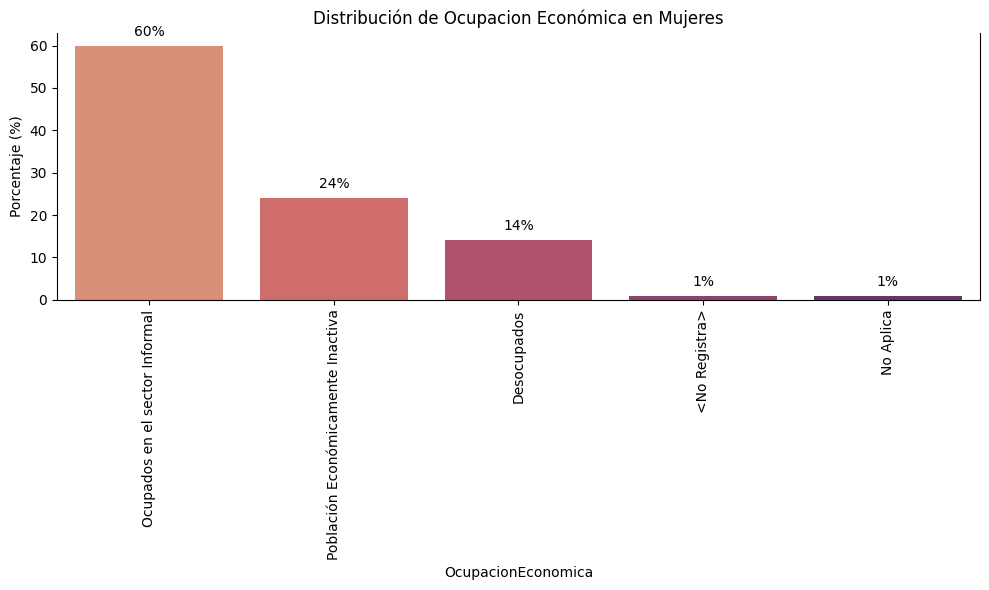

<Figure size 640x480 with 0 Axes>

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['OcupacionEconomica'].value_counts()[cat] / total_datos) * 100 for cat in df['OcupacionEconomica'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['OcupacionEconomica'].unique()
porcentajes_df = pd.DataFrame({'OcupacionEconomica': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='OcupacionEconomica', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Ocupacion Económica en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/ocupeconmujer.png', transparent=True)

plt.show()
#EL NO APLICA SIGNIFICA QUE SON DATOS DE PERSONAS FUERA DEL PROCESO

plt.savefig('grafico_transparente.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

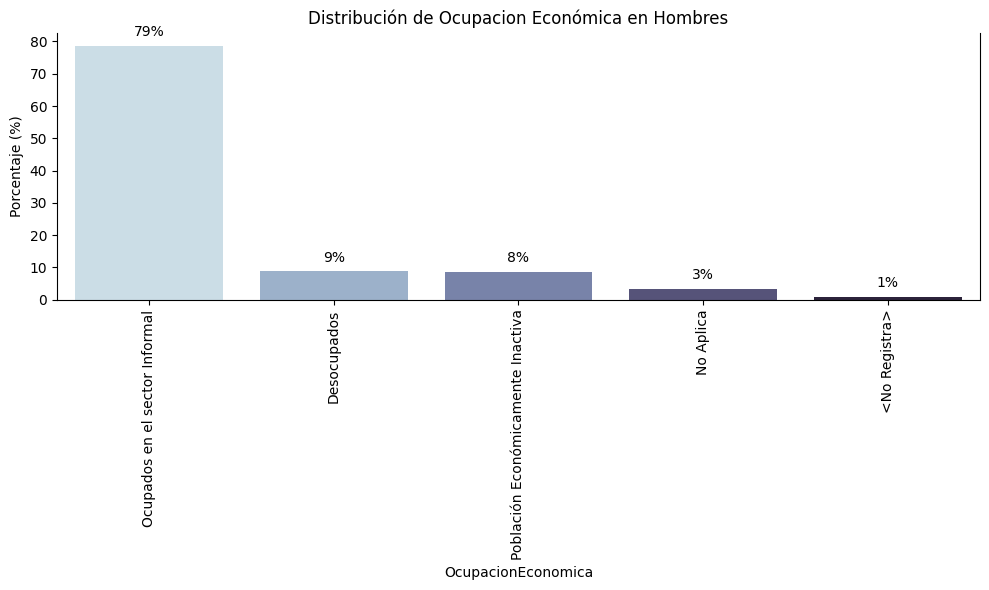

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['OcupacionEconomica'].value_counts()[cat] / total_datos) * 100 for cat in df['OcupacionEconomica'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['OcupacionEconomica'].unique()
porcentajes_df = pd.DataFrame({'OcupacionEconomica': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='OcupacionEconomica', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Ocupacion Económica en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/ocueconhombre.png', transparent=True)

plt.show()

#EL NO APLICA SIGNIFICA QUE SON DATOS DE PERSONAS FUERA DEL PROCESO

DEPARTAMENTO

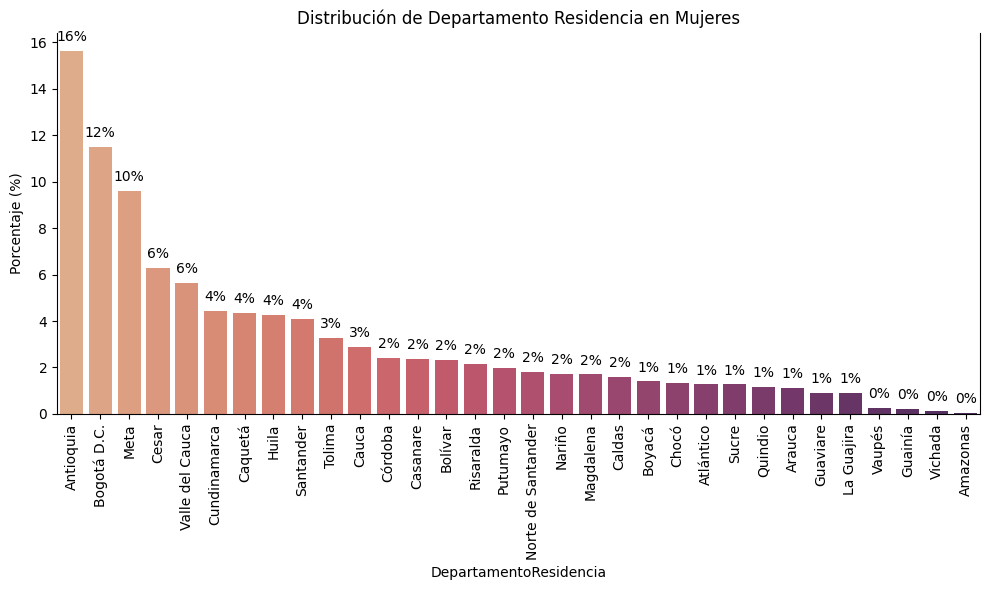

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['DepartamentoResidencia'].value_counts()[cat] / total_datos) * 100 for cat in df['DepartamentoResidencia'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['DepartamentoResidencia'].unique()
porcentajes_df = pd.DataFrame({'DepartamentoResidencia': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='DepartamentoResidencia', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Departamento Residencia en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/dptomujer.png', transparent=True)

plt.show()

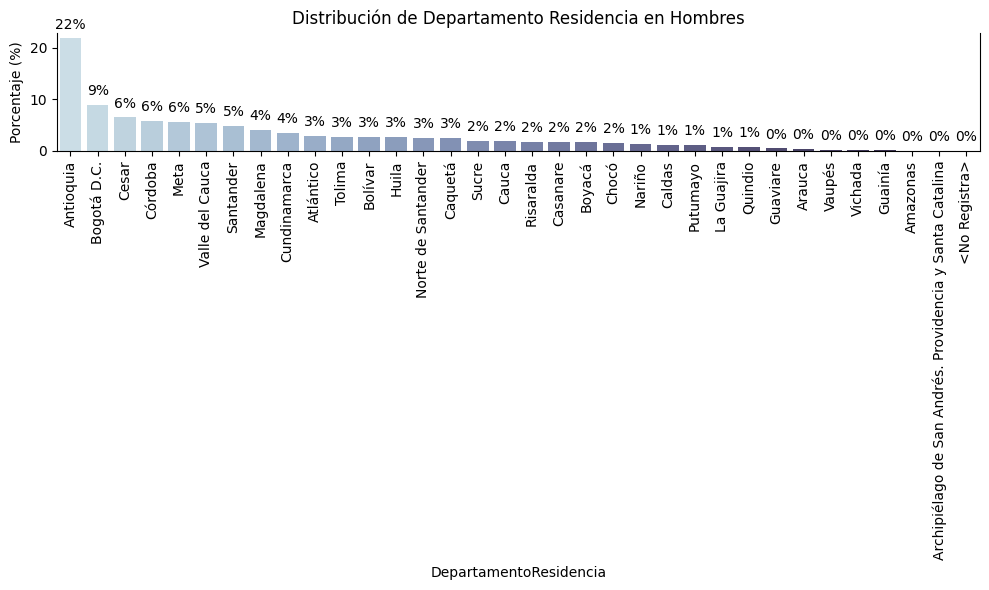

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['DepartamentoResidencia'].value_counts()[cat] / total_datos) * 100 for cat in df['DepartamentoResidencia'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['DepartamentoResidencia'].unique()
porcentajes_df = pd.DataFrame({'DepartamentoResidencia': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='DepartamentoResidencia', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Departamento Residencia en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/deptohombre.png', transparent=True)

plt.show()


DESEMBOLSO BIE

In [ ]:
df_fem['DesembolsoBie'].value_counts()/len(df_fem)

1    0.771395
0    0.228605
Name: DesembolsoBie, dtype: float64

In [ ]:
df_mas['DesembolsoBie'].value_counts()/len(df_mas)

1    0.635236
0    0.364764
Name: DesembolsoBie, dtype: float64

NUMERO DE HIJOS

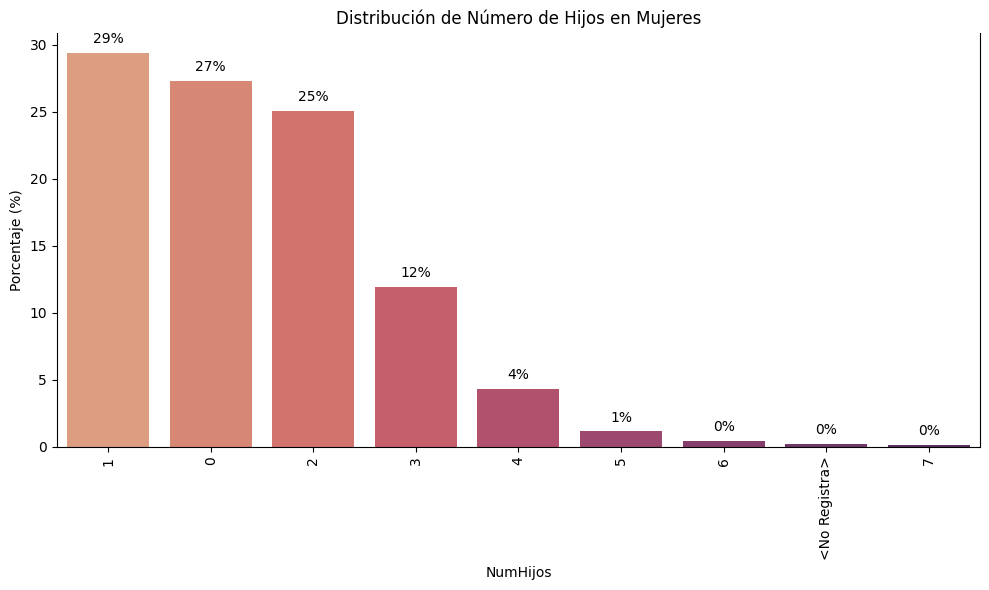

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NumHijos'].value_counts()[cat] / total_datos) * 100 for cat in df['NumHijos'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NumHijos'].unique()
porcentajes_df = pd.DataFrame({'NumHijos': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NumHijos', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Número de Hijos en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/hijosmujer.png', transparent=True)

plt.show()

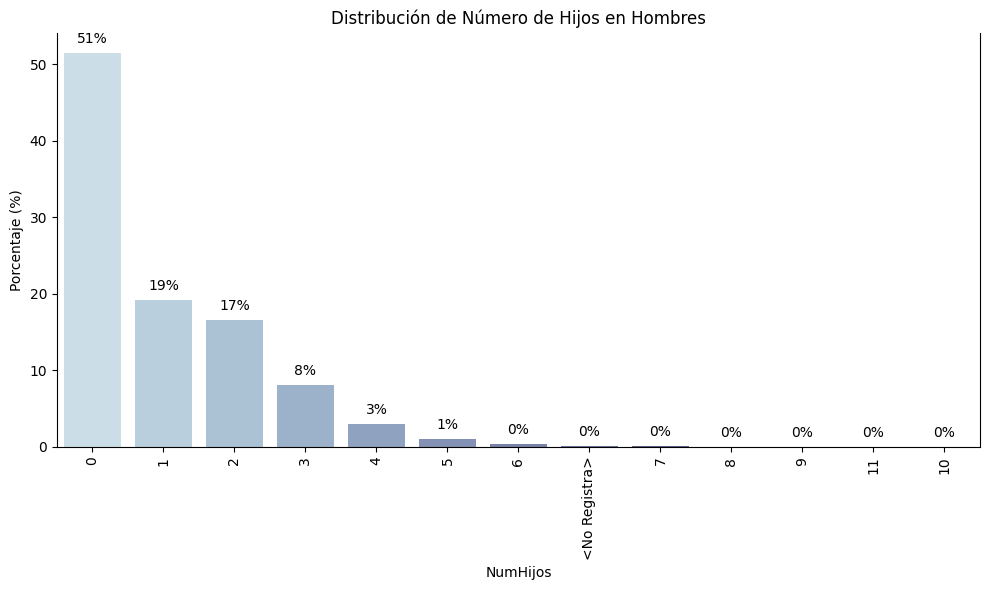

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NumHijos'].value_counts()[cat] / total_datos) * 100 for cat in df['NumHijos'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NumHijos'].unique()
porcentajes_df = pd.DataFrame({'NumHijos': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NumHijos', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Número de Hijos en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/hijoshombre.png', transparent=True)

plt.show()


TIPO DE VIVIENDA

<ipython-input-42-0499ce31a232>:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


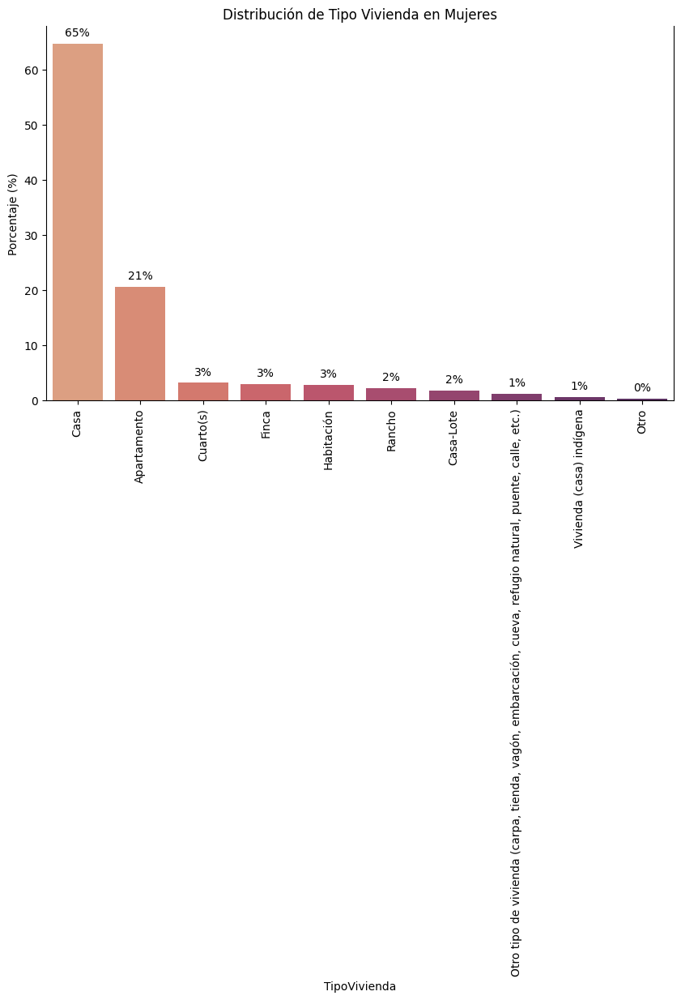

In [ ]:
# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['TipoVivienda'].value_counts()[cat] / total_datos) * 100 for cat in df['TipoVivienda'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['TipoVivienda'].unique()
porcentajes_df = pd.DataFrame({'TipoVivienda': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='TipoVivienda', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Tipo Vivienda en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/viviendamuj.png', transparent=True)

plt.show()

<ipython-input-43-997e182589c4>:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


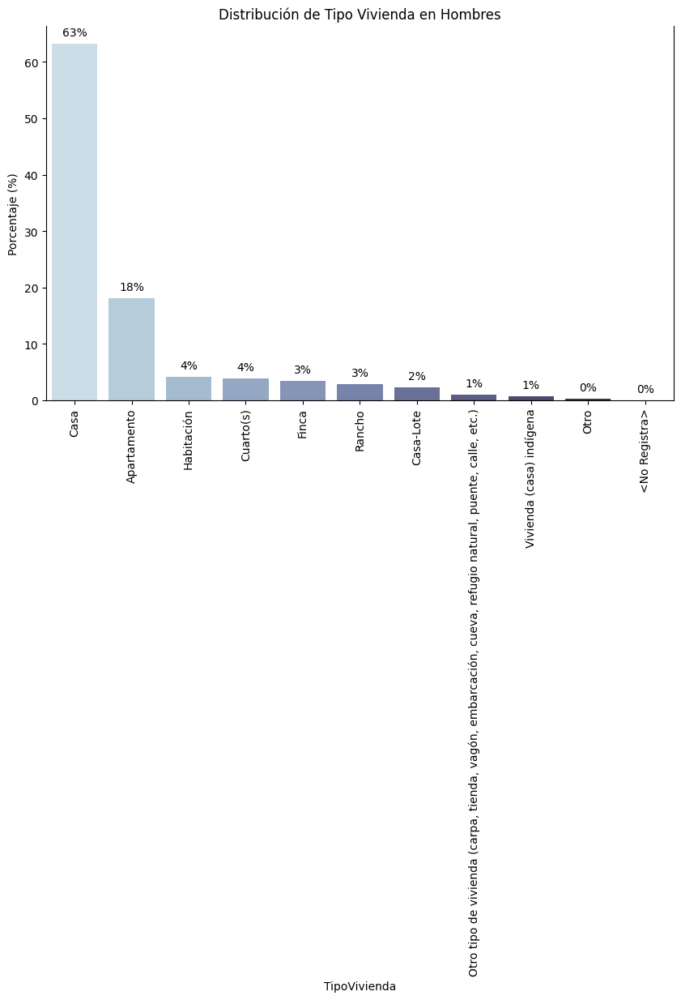

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['TipoVivienda'].value_counts()[cat] / total_datos) * 100 for cat in df['TipoVivienda'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['TipoVivienda'].unique()
porcentajes_df = pd.DataFrame({'TipoVivienda': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='TipoVivienda', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Tipo Vivienda en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/viviendahombre.png', transparent=True)

plt.show()

NATURALEZA VIVIENDA

<ipython-input-44-97d3372fc0fc>:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


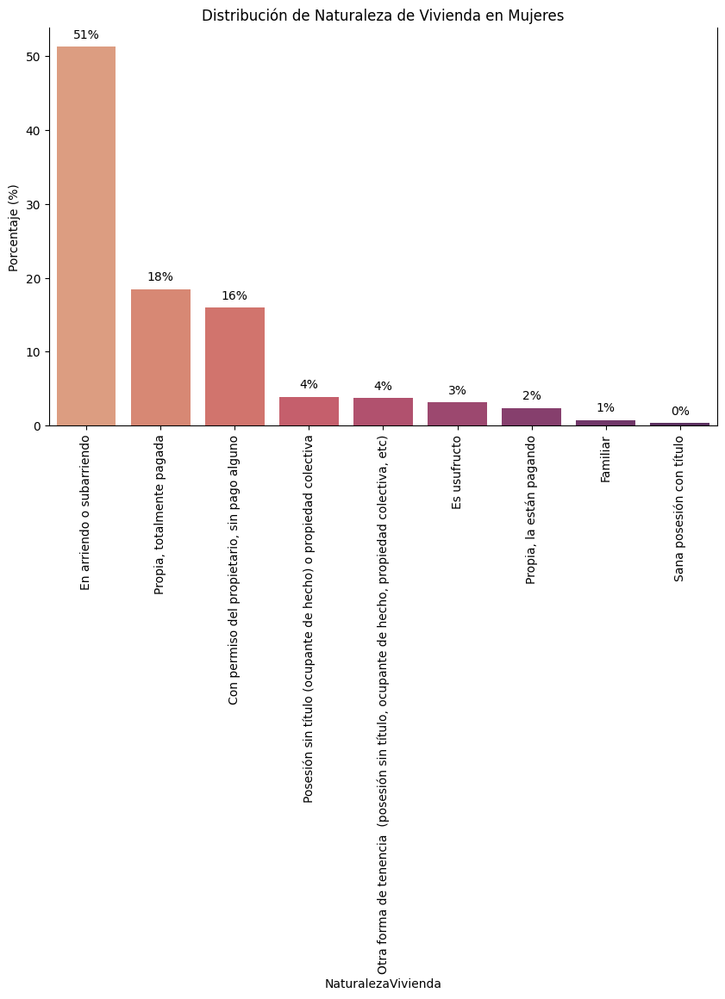

In [ ]:


# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NaturalezaVivienda'].value_counts()[cat] / total_datos) * 100 for cat in df['NaturalezaVivienda'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NaturalezaVivienda'].unique()
porcentajes_df = pd.DataFrame({'NaturalezaVivienda': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NaturalezaVivienda', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Naturaleza de Vivienda en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/natviviendamujer.png', transparent=True)

plt.show()

<ipython-input-61-4fda9585533e>:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


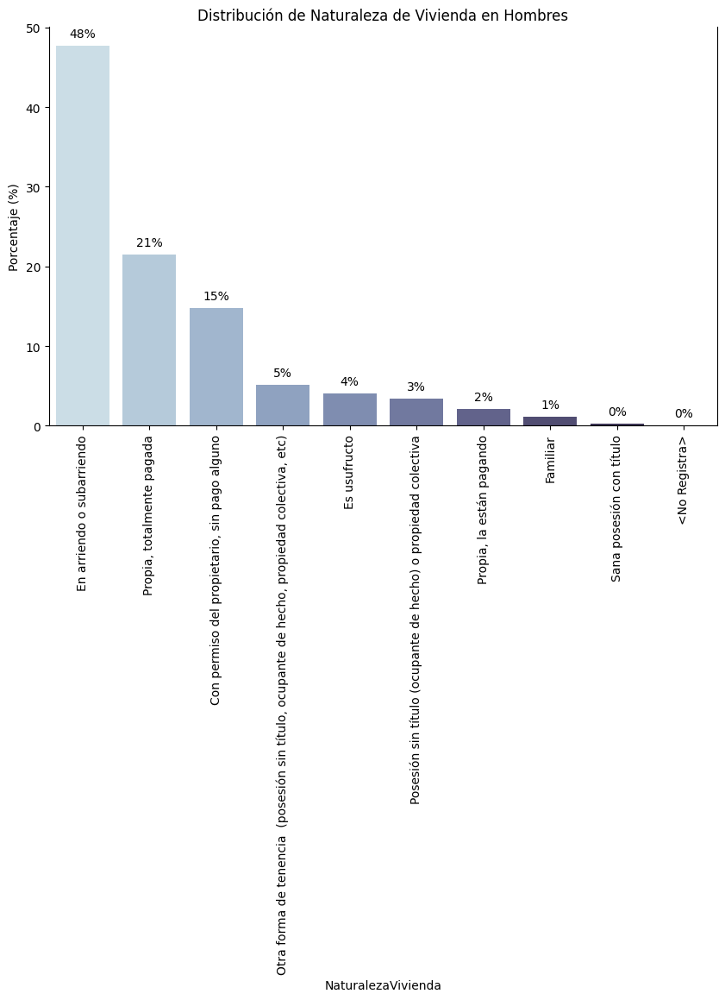

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['NaturalezaVivienda'].value_counts()[cat] / total_datos) * 100 for cat in df['NaturalezaVivienda'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['NaturalezaVivienda'].unique()
porcentajes_df = pd.DataFrame({'NaturalezaVivienda': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='NaturalezaVivienda', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Naturaleza de Vivienda en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/natviviendahombre.png', transparent=True)

plt.show()

SERVICIOS PUBLICOS

In [ ]:
df_fem['PoseeServPublic'].value_counts()/len(df_fem)

1    0.676076
0    0.323924
Name: PoseeServPublic, dtype: float64

In [ ]:
df_mas['PoseeServPublic'].value_counts()/len(df_mas)

1    0.65606
0    0.34394
Name: PoseeServPublic, dtype: float64

REGIMEN SALUD

In [ ]:
df_fem['RegimenSalud'].value_counts()/len(df_fem)

S - SUBSIDIADO      0.598178
C - CONTRIBUTIVO    0.225657
<No Registra>       0.176166
Name: RegimenSalud, dtype: float64

In [ ]:
df_mas['RegimenSalud'].value_counts()/len(df_mas)

S - SUBSIDIADO      0.479698
C - CONTRIBUTIVO    0.310930
<No Registra>       0.209373
Name: RegimenSalud, dtype: float64

NUMERO BENEFICIOS

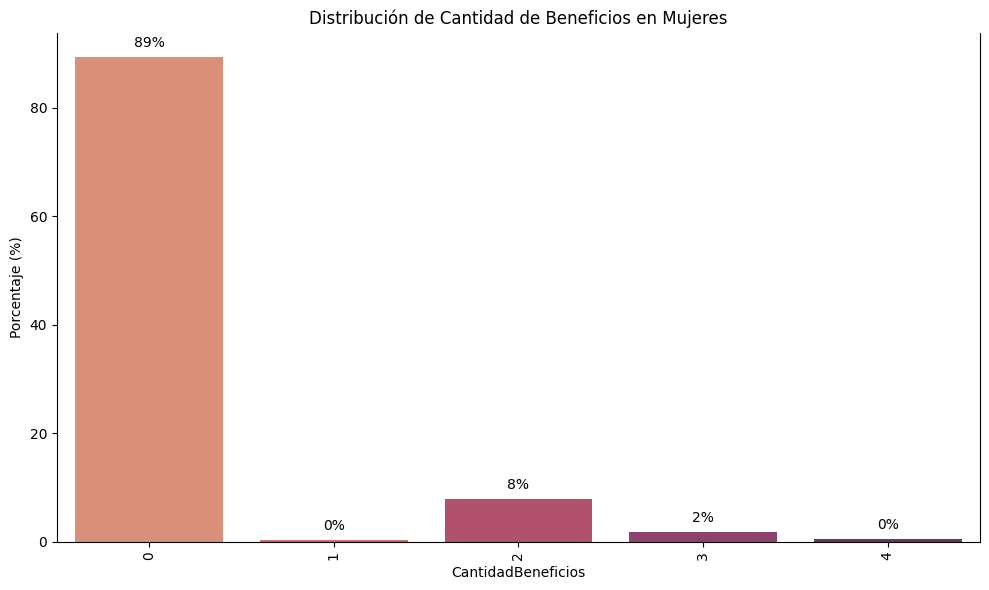

In [ ]:


# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'femenino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['CantidadBeneficios'].value_counts()[cat] / total_datos) * 100 for cat in df['CantidadBeneficios'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['CantidadBeneficios'].unique()
porcentajes_df = pd.DataFrame({'CantidadBeneficios': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de rosados
palette = sns.color_palette("flare", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='CantidadBeneficios', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Cantidad de Beneficios en Mujeres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/beneficiosmujer.png', transparent=True)

plt.show()

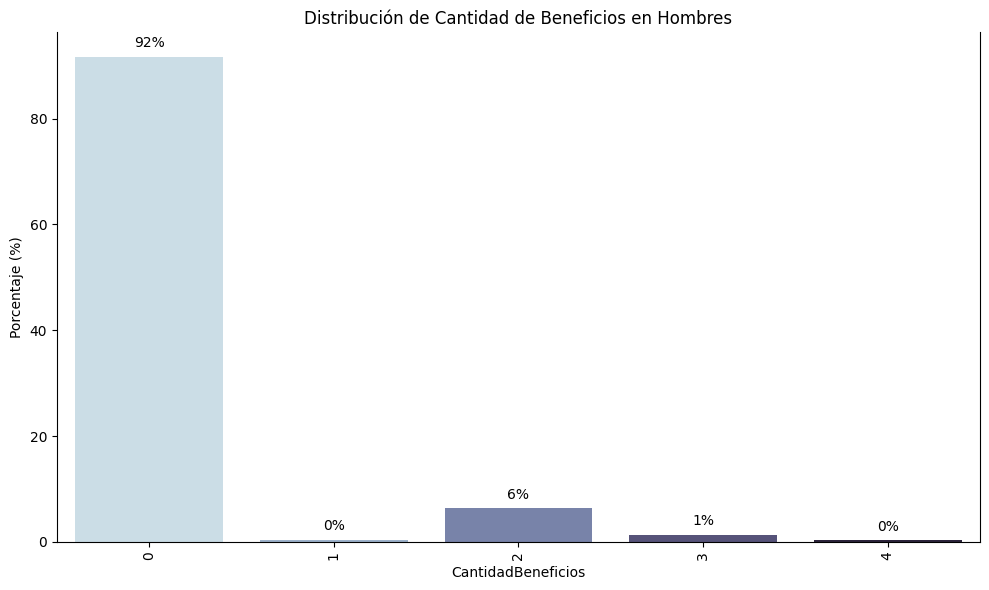

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset[df_Dataset['Sexo'] == 'masculino']
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['CantidadBeneficios'].value_counts()[cat] / total_datos) * 100 for cat in df['CantidadBeneficios'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['CantidadBeneficios'].unique()
porcentajes_df = pd.DataFrame({'CantidadBeneficios': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='Porcentaje', ascending=False)

# Elegir una paleta de colores con degradados de
palette = sns.color_palette("ch:s=.25,rot=-.25", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='CantidadBeneficios', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Cantidad de Beneficios en Hombres')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/natviviendahombre.png', transparent=True)

plt.show()

#### Para la pregunta de si el proceso de desmovilización fue exitoso según el presidente

AÑO DE DESMOVILIZACION

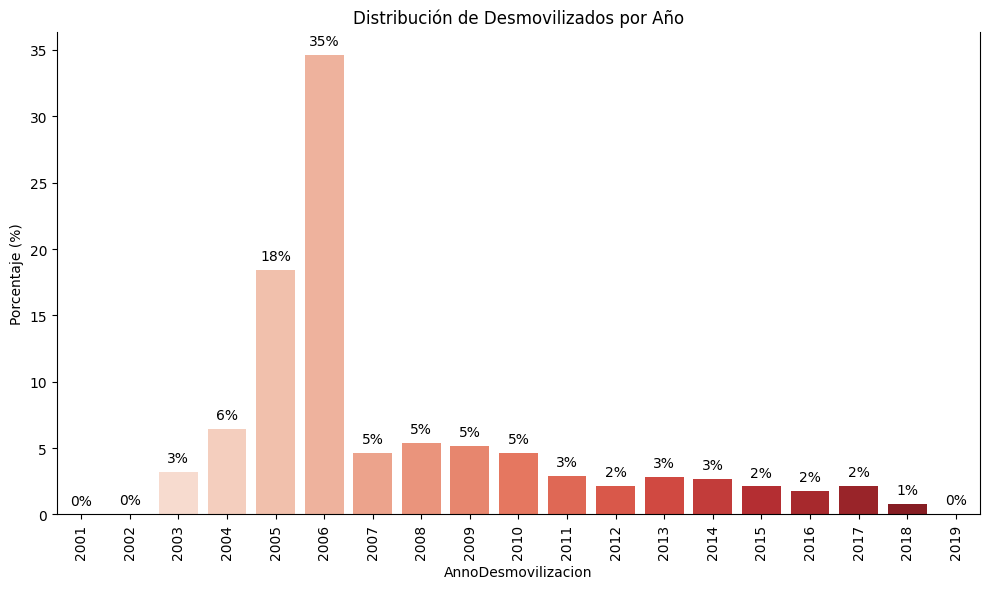

In [ ]:

# Ejemplo de DataFrame con una columna categórica
data = df_Dataset
df = pd.DataFrame(data)

# Calcular los porcentajes de cada categoría
total_datos = len(df)
porcentajes = [(df['AnnoDesmovilizacion'].value_counts()[cat] / total_datos) * 100 for cat in df['AnnoDesmovilizacion'].unique()]

# Crear un DataFrame para los porcentajes y categorías
categorias_unicas = df['AnnoDesmovilizacion'].unique()
porcentajes_df = pd.DataFrame({'AnnoDesmovilizacion': categorias_unicas, 'Porcentaje': porcentajes})

# Ordenar el DataFrame por porcentaje descendente
porcentajes_df = porcentajes_df.sort_values(by='AnnoDesmovilizacion', ascending=True)

# Elegir una paleta de colores con degradados
palette = sns.color_palette("Reds", n_colors=len(categorias_unicas))

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='AnnoDesmovilizacion', y='Porcentaje', data=porcentajes_df, palette=palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Desmovilizados por Año')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/desmovxaño.png', transparent=True)

plt.show()

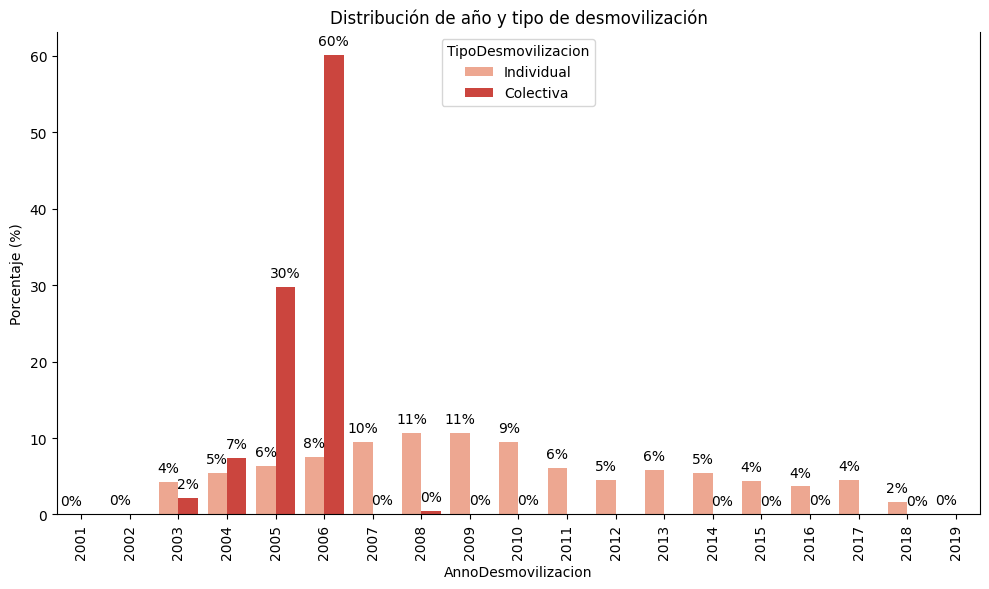

In [ ]:
df = df_Dataset

totals = df.groupby('TipoDesmovilizacion').size()
# Calcular los porcentajes
porcentajes = []
for group, year_group in df.groupby(['AnnoDesmovilizacion', 'TipoDesmovilizacion']):
    presidente = group[1]
    porcentaje = (len(year_group) / totals[presidente]) * 100
    porcentajes.append((group[0], presidente, porcentaje))

# Crear un DataFrame para los porcentajes y categorías
porcentajes_df = pd.DataFrame(porcentajes, columns=['AnnoDesmovilizacion', 'TipoDesmovilizacion', 'Porcentaje'])

new_palette = "Reds"

# Ordenar el DataFrame por grupo etario y año
porcentajes_df = porcentajes_df.sort_values(by=['AnnoDesmovilizacion', 'TipoDesmovilizacion'])

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='AnnoDesmovilizacion', y='Porcentaje', hue='TipoDesmovilizacion', data=porcentajes_df, palette=new_palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de año y tipo de desmovilización')
plt.ylabel('Porcentaje (%)')
# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/añoxdesmov.png', transparent=True)

plt.show()

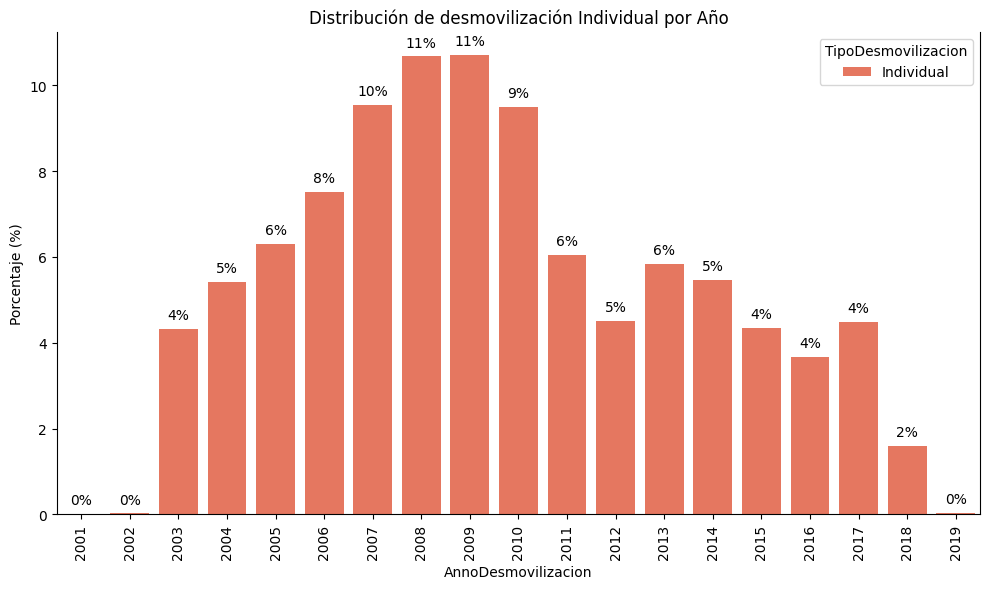

In [ ]:
df = df_Dataset[df_Dataset['TipoDesmovilizacion']=='Individual']

# Calcular los porcentajes
total = len(df)
porcentajes = []
for group, year_group in df.groupby(['AnnoDesmovilizacion', 'TipoDesmovilizacion']):
    porcentaje = (len(year_group) / total) * 100
    porcentajes.append((group[0], group[1], porcentaje))

# Crear un DataFrame para los porcentajes y categorías
porcentajes_df = pd.DataFrame(porcentajes, columns=['AnnoDesmovilizacion', 'TipoDesmovilizacion', 'Porcentaje'])

new_palette = "Reds"

# Ordenar el DataFrame por grupo etario y año
porcentajes_df = porcentajes_df.sort_values(by=['AnnoDesmovilizacion', 'TipoDesmovilizacion'])

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='AnnoDesmovilizacion', y='Porcentaje', hue='TipoDesmovilizacion', data=porcentajes_df, palette=new_palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de desmovilización Individual por Año')
plt.ylabel('Porcentaje (%)')
# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/desmovindivxaño.png', transparent=True)

plt.show()
#SE VE EL AUMENTO EN PERIODO SANTOS

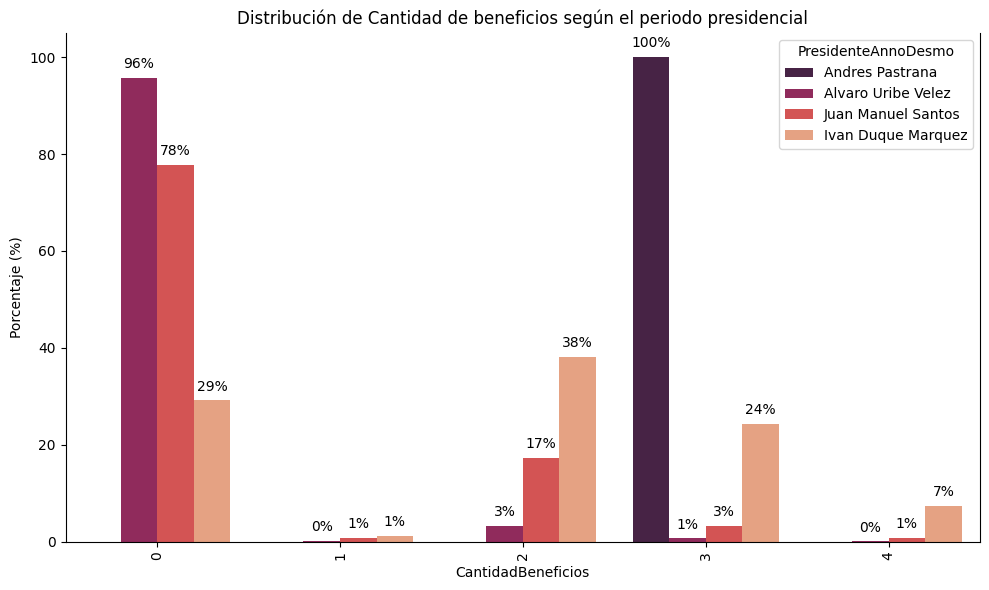

In [ ]:
df = df_Dataset

president_totals = df.groupby('PresidenteAnnoDesmo').size()
# Calcular los porcentajes
porcentajes = []
for group, year_group in df.groupby(['CantidadBeneficios', 'PresidenteAnnoDesmo']):
    presidente = group[1]
    porcentaje = (len(year_group) / president_totals[presidente]) * 100
    porcentajes.append((group[0], presidente, porcentaje))

# Crear un DataFrame para los porcentajes y categorías
porcentajes_df = pd.DataFrame(porcentajes, columns=['CantidadBeneficios', 'PresidenteAnnoDesmo', 'Porcentaje'])

new_palette = "rocket"

# Reordenar los niveles del índice para cambiar el orden de los labels
order = ['Andres Pastrana', 'Alvaro Uribe Velez', 'Juan Manuel Santos', 'Ivan Duque Marquez']
porcentajes_df['PresidenteAnnoDesmo'] = pd.Categorical(porcentajes_df['PresidenteAnnoDesmo'], categories=order, ordered=True)
porcentajes_df = porcentajes_df.sort_values(['CantidadBeneficios', 'PresidenteAnnoDesmo'])

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='CantidadBeneficios', y='Porcentaje', hue='PresidenteAnnoDesmo', data=porcentajes_df, palette=new_palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Cantidad de beneficios según el periodo presidencial')
plt.ylabel('Porcentaje (%)')
# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/beneficiosxpresi.png', transparent=True)

plt.show()

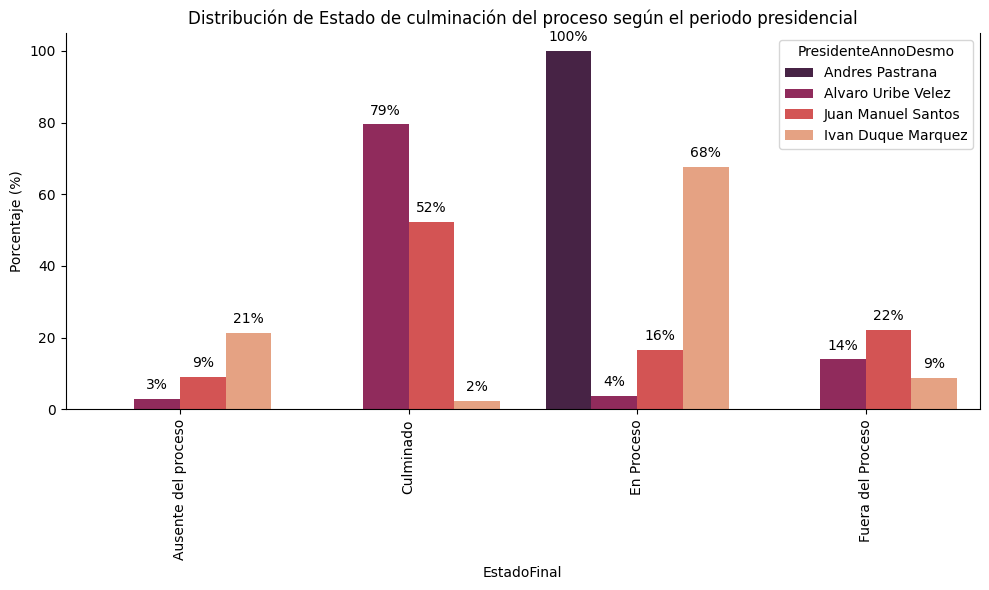

In [ ]:
df = df_Dataset

# Calcular los porcentajes
president_totals = df.groupby('PresidenteAnnoDesmo').size()

porcentajes = []
for group, year_group in df.groupby(['EstadoFinal', 'PresidenteAnnoDesmo']):
    presidente = group[1]
    porcentaje = (len(year_group) / president_totals[presidente]) * 100
    porcentajes.append((group[0], presidente, porcentaje))

# Crear un DataFrame para los porcentajes y categorías
porcentajes_df = pd.DataFrame(porcentajes, columns=['EstadoFinal', 'PresidenteAnnoDesmo', 'Porcentaje'])

new_palette = "rocket"

# Reordenar los niveles del índice para cambiar el orden de los labels
order = ['Andres Pastrana', 'Alvaro Uribe Velez', 'Juan Manuel Santos', 'Ivan Duque Marquez']
porcentajes_df['PresidenteAnnoDesmo'] = pd.Categorical(porcentajes_df['PresidenteAnnoDesmo'], categories=order, ordered=True)
porcentajes_df = porcentajes_df.sort_values(['EstadoFinal', 'PresidenteAnnoDesmo'])

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='EstadoFinal', y='Porcentaje', hue='PresidenteAnnoDesmo', data=porcentajes_df, palette=new_palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior

plt.title('Distribución de Estado de culminación del proceso según el periodo presidencial')
plt.ylabel('Porcentaje (%)')
# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/efinalxpresidente.png', transparent=True)

plt.show()

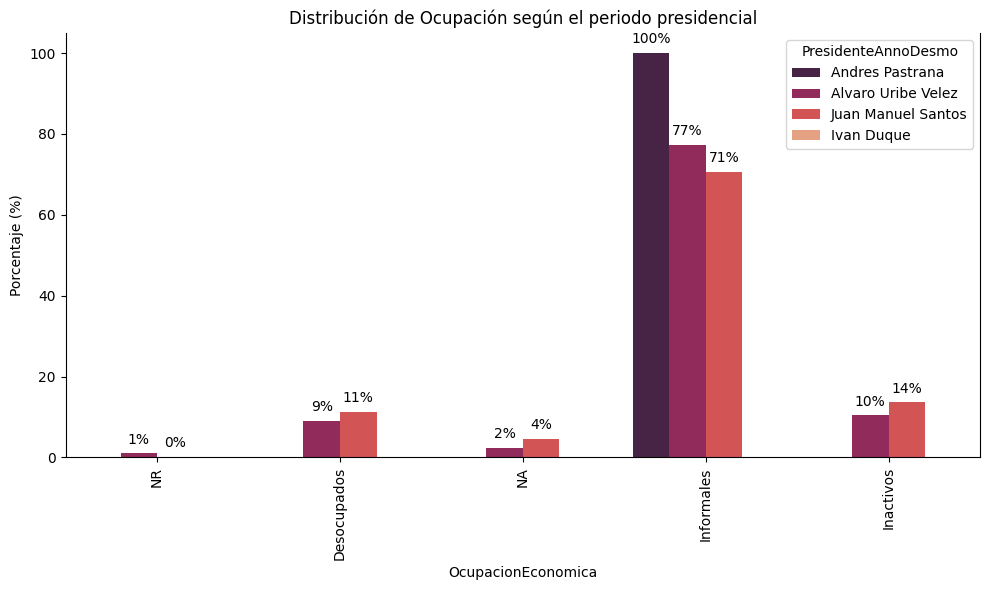

In [ ]:
df = df_Dataset

# Calcular los totales para cada presidente
president_totals = df.groupby('PresidenteAnnoDesmo').size()

# Calcular los porcentajes
porcentajes = []
for group, year_group in df.groupby(['OcupacionEconomica', 'PresidenteAnnoDesmo']):
    presidente = group[1]
    porcentaje = (len(year_group) / president_totals[presidente]) * 100
    porcentajes.append((group[0], presidente, porcentaje))

# Crear un DataFrame para los porcentajes y categorías
porcentajes_df = pd.DataFrame(porcentajes, columns=['OcupacionEconomica', 'PresidenteAnnoDesmo', 'Porcentaje'])

# Reordenar los niveles del índice para cambiar el orden de los labels
order = ['Andres Pastrana', 'Alvaro Uribe Velez', 'Juan Manuel Santos', 'Ivan Duque']
porcentajes_df['PresidenteAnnoDesmo'] = pd.Categorical(porcentajes_df['PresidenteAnnoDesmo'], categories=order, ordered=True)
porcentajes_df = porcentajes_df.sort_values(['OcupacionEconomica', 'PresidenteAnnoDesmo'])

new_palette = "rocket"

# Crear el gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='OcupacionEconomica', y='Porcentaje', hue='PresidenteAnnoDesmo', data=porcentajes_df, palette=new_palette)
ax.spines['top'].set_visible(False)  # Eliminar el borde superior
ax.set_xticklabels(['NR','Desocupados','NA','Informales','Inactivos'])
plt.title('Distribución de Ocupación según el periodo presidencial')
plt.ylabel('Porcentaje (%)')

# Agregar etiquetas a las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor legibilidad
plt.tight_layout()
# Guardar el gráfico como una imagen PNG con transparencia
plt.savefig('/content/ocupacionxpresidente.png', transparent=True)

plt.show()

### **7. Trabajo en equipo**

#### Reglas de equipo

* Reuniones semanales de avance de tareas
*	Designación de tareas por grupos y personas
*	Componente que se realiza se carga a un espacio colaborativo (Word & Collab) para revisión de los demás
*	Constante y abierta comunicación en el equipo
*	Definir entre todos los pasos a realizar y tener acordado los pasos a seguir.
*	Trabajo integral desde el inicio que permite la visión grupal del trabajo y de la materia prima del proyecto
*	Constante retroalimentación


#### Reuniones realizadas con asistentes y actividades desarrolladas

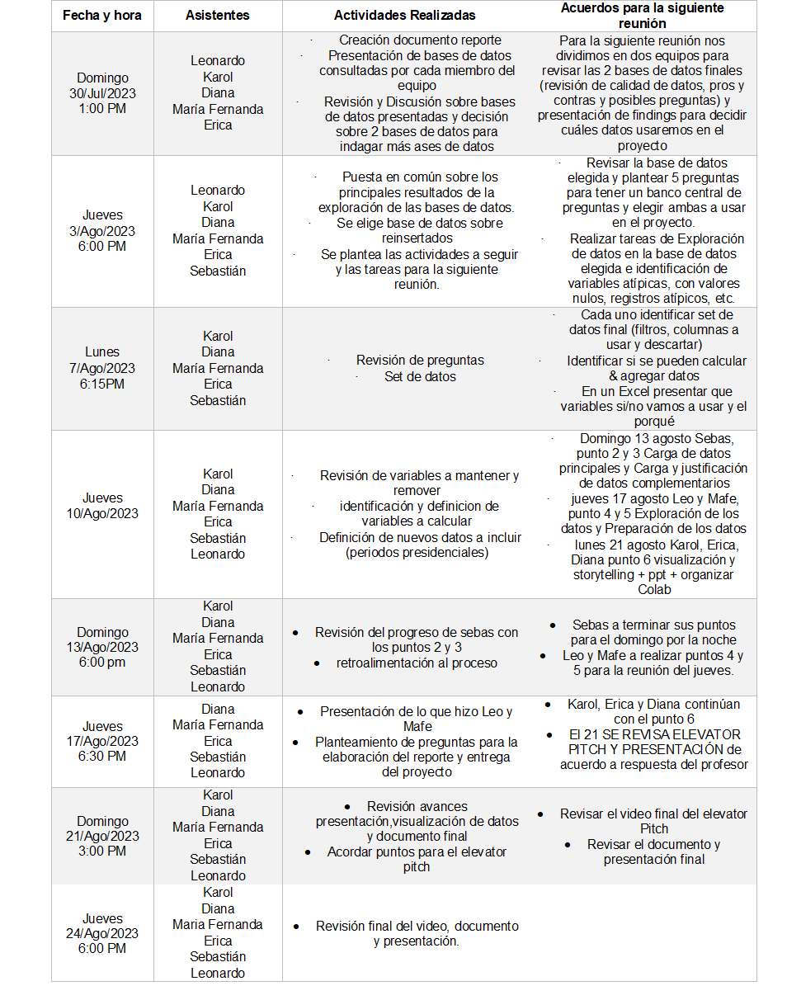

#### Evaluación del trabajo, autoevaluación y evaluación de pares

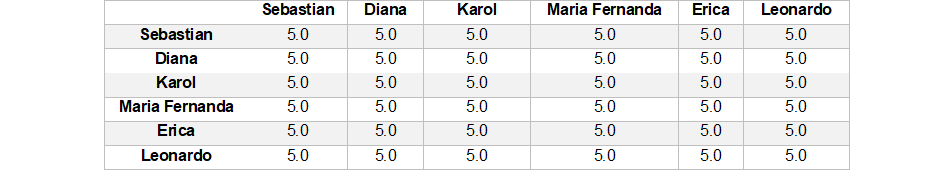